In [1]:
import os
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator 
from tensorflow import keras

In [2]:
# CONSTANTS!!!


SEED = 909
BATCH_SIZE_TRAIN = 32
BATCH_SIZE_TEST = 32

IMAGE_HEIGHT = 304
IMAGE_WIDTH = 304
IMG_SIZE = (IMAGE_HEIGHT, IMAGE_WIDTH)
NUM_TRAIN = 136

data_dir = 'data/slices/train/img/'
data_dir_mask = 'data/slices/train/mask/'

data_dir_train_image = os.path.join(data_dir)
data_dir_train_mask = os.path.join(data_dir_mask)

data_dir_test_img = 'database/output/testing/img/'
data_dir_test_mask = 'database/output/testing/mask/'
data_dir_test_image = os.path.join(data_dir_test_img)
data_dir_test_mask = os.path.join(data_dir_test_mask)

# STEP 3 - Slicing and saving
SLICE_X = True
SLICE_Y = False
SLICE_Z = False

SLICE_DECIMATE_IDENTIFIER = 3

NUM_TEST = 71
NUM_OF_EPOCHS = 10


In [3]:
def create_segmentation_generator_train(img_path, msk_path, BATCH_SIZE):
    data_gen_args = dict(rescale=1./255
#                      featurewise_center=True,
#                      featurewise_std_normalization=True,
#                      rotation_range=90
#                      width_shift_range=0.2,
#                      height_shift_range=0.2,
#                      zoom_range=0.3

                        )
    datagen = ImageDataGenerator(**data_gen_args)
    
    img_generator = datagen.flow_from_directory(img_path, target_size=IMG_SIZE, class_mode=None, color_mode='grayscale', batch_size=BATCH_SIZE, seed=SEED)
    msk_generator = datagen.flow_from_directory(msk_path, target_size=IMG_SIZE, class_mode=None, color_mode='grayscale', batch_size=BATCH_SIZE, seed=SEED)
    return zip(img_generator, msk_generator)

# Remember not to perform any image augmentation in the test generator!
def create_segmentation_generator_test(img_path, msk_path, BATCH_SIZE):
    data_gen_args = dict(rescale=1./255)
    datagen = ImageDataGenerator(**data_gen_args)
    
    img_generator = datagen.flow_from_directory(img_path, target_size=IMG_SIZE, class_mode=None, color_mode='grayscale', batch_size=BATCH_SIZE, seed=SEED)
    msk_generator = datagen.flow_from_directory(msk_path, target_size=IMG_SIZE, class_mode=None, color_mode='grayscale', batch_size=BATCH_SIZE, seed=SEED)
    return zip(img_generator, msk_generator)

In [4]:
train_generator = create_segmentation_generator_train(data_dir_train_image, data_dir_train_mask, BATCH_SIZE_TRAIN)
test_generator = create_segmentation_generator_test(data_dir_test_image, data_dir_test_mask, BATCH_SIZE_TEST)

Found 163 images belonging to 1 classes.
Found 163 images belonging to 1 classes.
Found 71 images belonging to 1 classes.
Found 71 images belonging to 1 classes.


In [5]:
def display(display_list):
    plt.figure(figsize=(15,15))
    
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]), cmap='gray')
    plt.show()

In [6]:
def show_dataset(datagen, num=1):
    for i in range(0,num):
        image,mask = next(datagen)
        display([image[0], mask[0]])

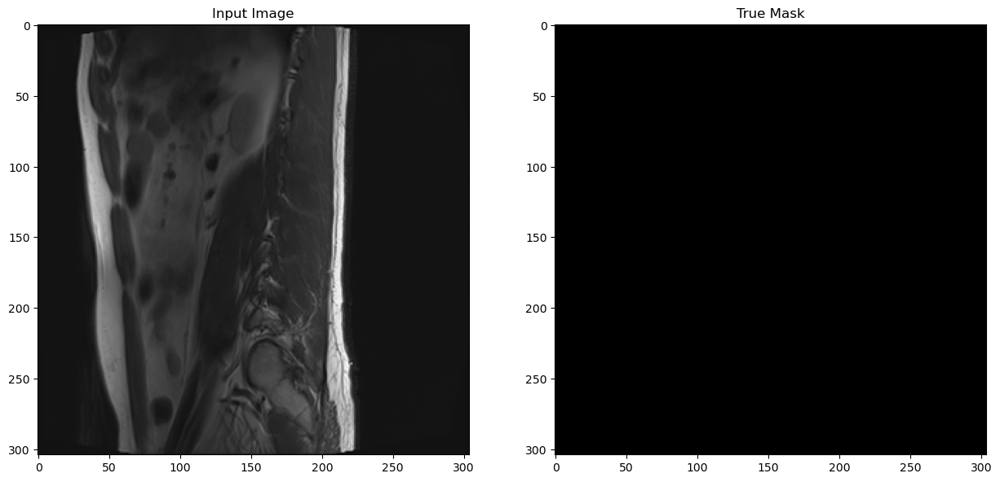

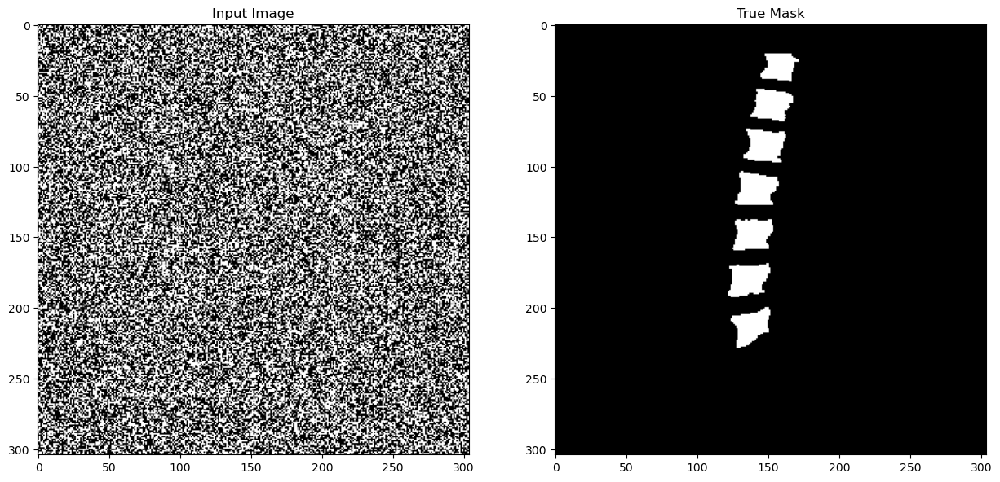

In [7]:
show_dataset(train_generator, 2)


In [8]:
def unet(n_levels, initial_features=32, n_blocks=2, kernel_size=3, pooling_size=2, in_channels=1, out_channels=1):
    inputs = keras.layers.Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, in_channels))
    x = inputs
    
    convpars = dict(kernel_size=kernel_size, activation='relu', padding='same')
    
    #downstream
    skips = {}
    for level in range(n_levels):
        for _ in range(n_blocks):
            x = keras.layers.Conv2D(initial_features * 2 ** level, **convpars)(x)
        if level < n_levels - 1:
            skips[level] = x
            x = keras.layers.MaxPool2D(pooling_size)(x)
            
    # upstream
    for level in reversed(range(n_levels-1)):
        x = keras.layers.Conv2DTranspose(initial_features * 2 ** level, strides=pooling_size, **convpars)(x)
        x = keras.layers.Concatenate()([x, skips[level]])
        for _ in range(n_blocks):
            x = keras.layers.Conv2D(initial_features * 2 ** level, **convpars)(x)
            
    # output
    activation = 'sigmoid' if out_channels == 1 else 'softmax'
    x = keras.layers.Conv2D(out_channels, kernel_size=1, activation=activation, padding='same')(x)
    
    return keras.Model(inputs=[inputs], outputs=[x], name=f'UNET-L{n_levels}-F{initial_features}')
        

In [9]:
EPOCH_STEP_TRAIN = NUM_TRAIN // BATCH_SIZE_TRAIN
EPOCH_STEP_TEST = NUM_TEST // BATCH_SIZE_TEST

model = unet(4)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [10]:
model.summary()

Model: "UNET-L4-F32"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 304, 304, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 304, 304, 32)         320       ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 304, 304, 32)         9248      ['conv2d[0][0]']              
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 152, 152, 32)         0         ['conv2d_1[0][0]']            
 D)                                                                                     

In [11]:
history = model.fit_generator(generator=train_generator, 
                    steps_per_epoch=EPOCH_STEP_TRAIN, 
                    validation_data=test_generator, 
                    validation_steps=EPOCH_STEP_TEST,
                   epochs=NUM_OF_EPOCHS)

Epoch 1/10


/var/folders/0q/qy5wdpdx2pg73njswdsy1cvm0000gn/T/ipykernel_10068/2541946268.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(generator=train_generator,


4/4 [==============================] - 39s 9s/step - loss: 0.6711 - accuracy: 0.9727 - val_loss: 0.4909 - val_accuracy: 0.9748
Epoch 2/10
4/4 [==============================] - 46s 12s/step - loss: 0.3765 - accuracy: 0.9754 - val_loss: 0.1762 - val_accuracy: 0.9771
Epoch 3/10
4/4 [==============================] - 37s 9s/step - loss: 0.2202 - accuracy: 0.9754 - val_loss: 0.1730 - val_accuracy: 0.9793
Epoch 4/10
4/4 [==============================] - 38s 9s/step - loss: 0.1613 - accuracy: 0.9784 - val_loss: 0.1540 - val_accuracy: 0.9757
Epoch 5/10
4/4 [==============================] - 45s 12s/step - loss: 0.1554 - accuracy: 0.9761 - val_loss: 0.1159 - val_accuracy: 0.9807
Epoch 6/10
4/4 [==============================] - 35s 8s/step - loss: 0.1368 - accuracy: 0.9765 - val_loss: 0.1151 - val_accuracy: 0.9766
Epoch 7/10
4/4 [==============================] - 37s 9s/step - loss: 0.1353 - accuracy: 0.9765 - val_loss: 0.1180 - val_accuracy: 0.9754
Epoch 8/10
4/4 [===========================

In [12]:
print("training_accuracy", history.history['accuracy'][-1])
print("validation_accuracy", history.history['val_accuracy'][-1])

training_accuracy 0.9758380651473999
validation_accuracy 0.9757482409477234


<Axes: >

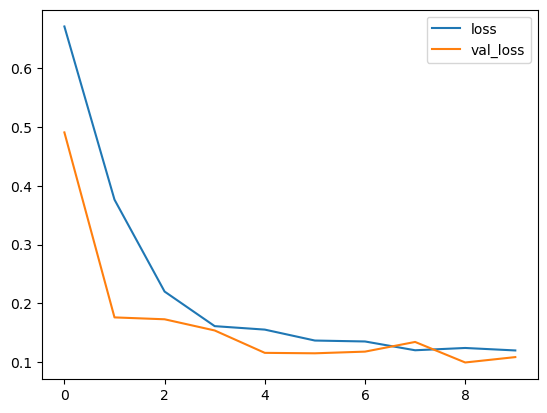

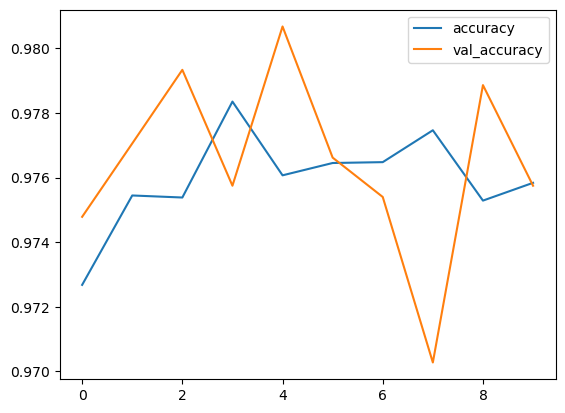

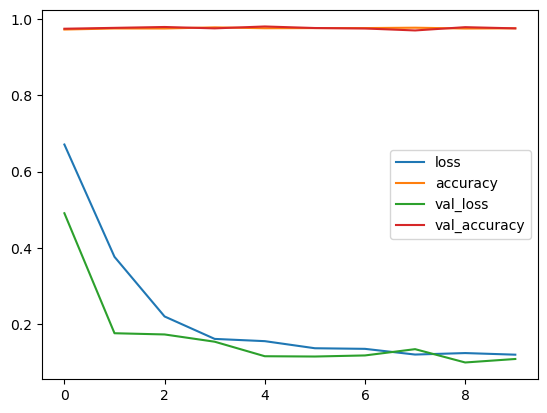

In [13]:
import pandas as pd
losses = pd.DataFrame(history.history)
losses.head()
losses[['loss','val_loss']].plot() 
losses[['accuracy','val_accuracy']].plot() 
losses.plot()

In [14]:
model.save('unet.h5')

/Users/preditwinsmac/anaconda3/lib/python3.11/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [15]:
test_generator = create_segmentation_generator_test(data_dir_test_image, data_dir_test_mask, 1)

Found 71 images belonging to 1 classes.
Found 71 images belonging to 1 classes.


In [16]:
def show_prediction(datagen, num=1):
    for i in range(0,num):
        image,mask = next(datagen)
        pred_mask = model.predict(image)[0] > 0.5
        display([image[0], mask[0], pred_mask])

1/1 [==============================] - 0s 166ms/step


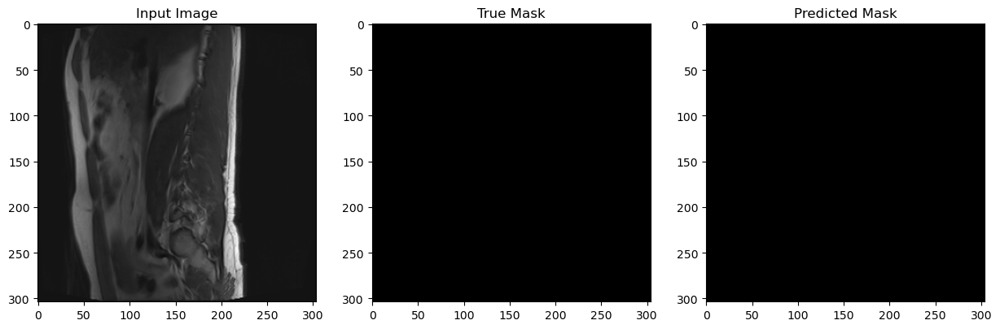

1/1 [==============================] - 0s 131ms/step


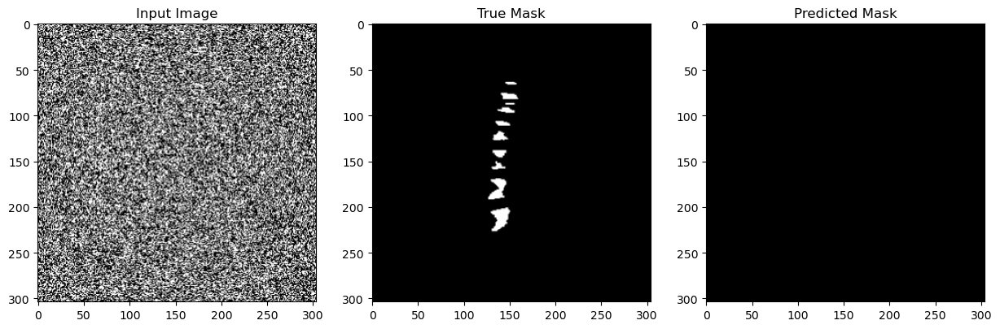

1/1 [==============================] - 0s 123ms/step


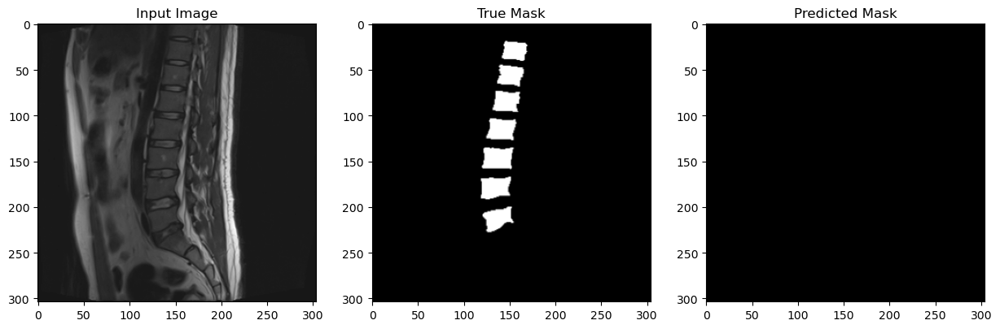

1/1 [==============================] - 0s 132ms/step


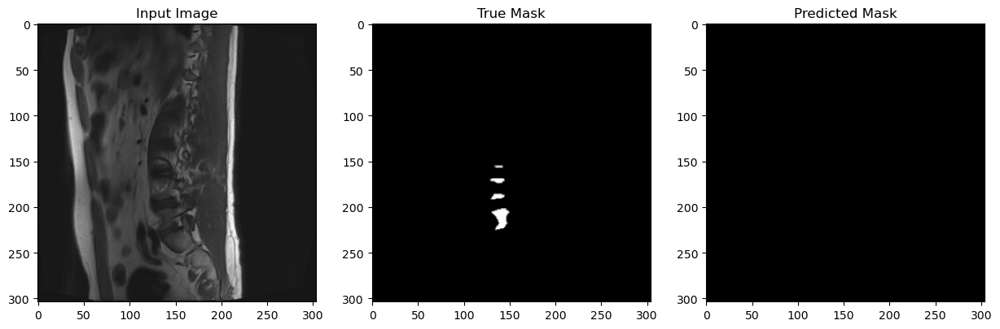

1/1 [==============================] - 0s 125ms/step


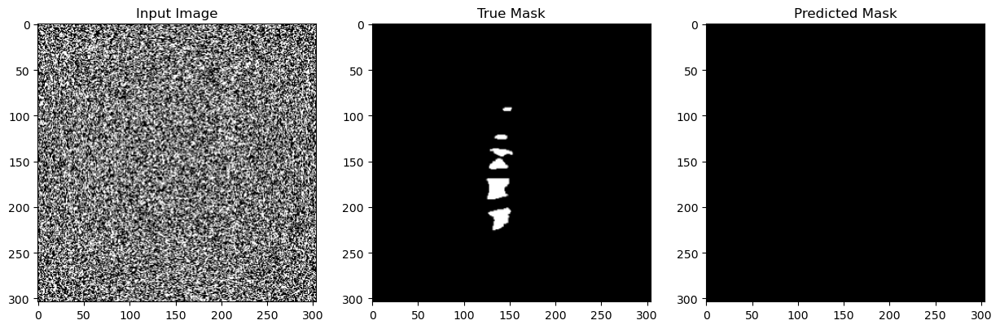

1/1 [==============================] - 0s 117ms/step


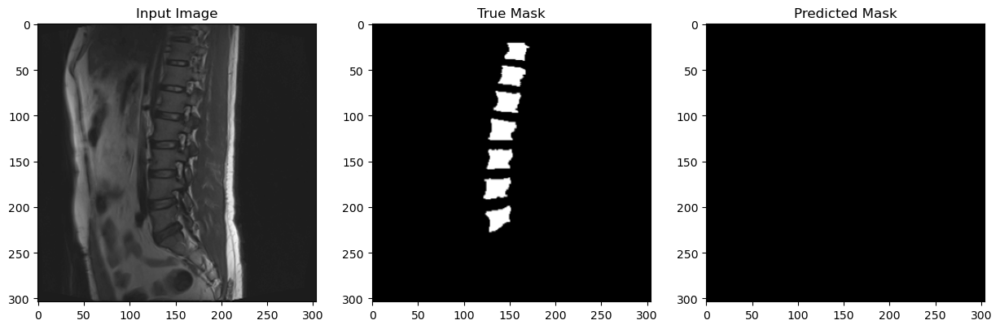

1/1 [==============================] - 0s 127ms/step


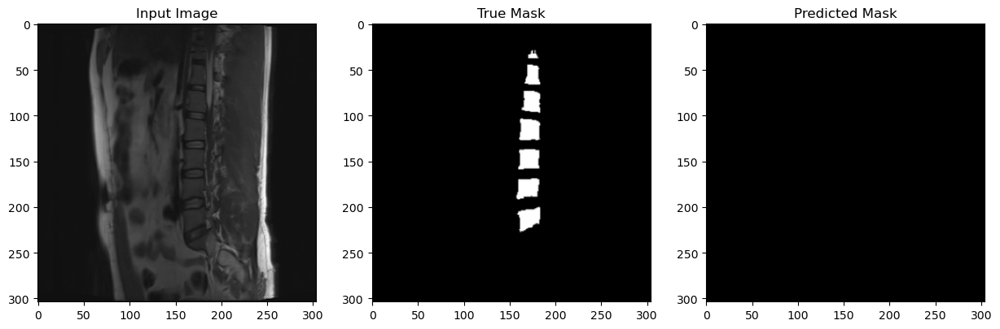

1/1 [==============================] - 0s 129ms/step


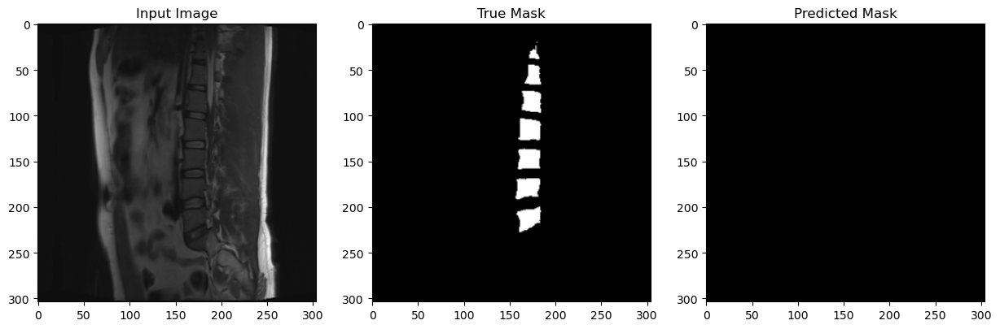

1/1 [==============================] - 0s 129ms/step


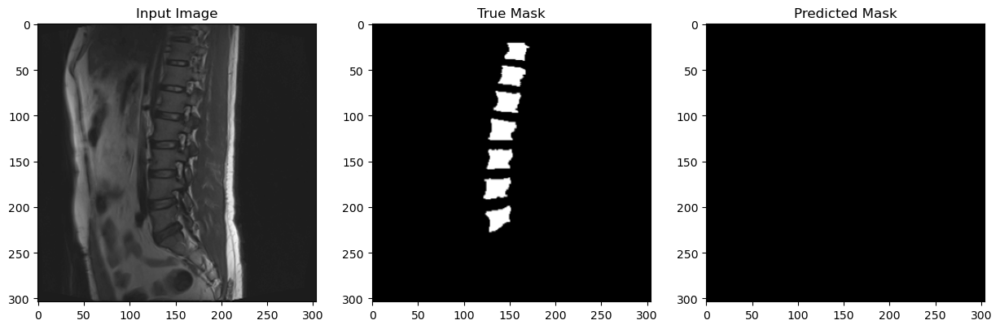

1/1 [==============================] - 0s 130ms/step


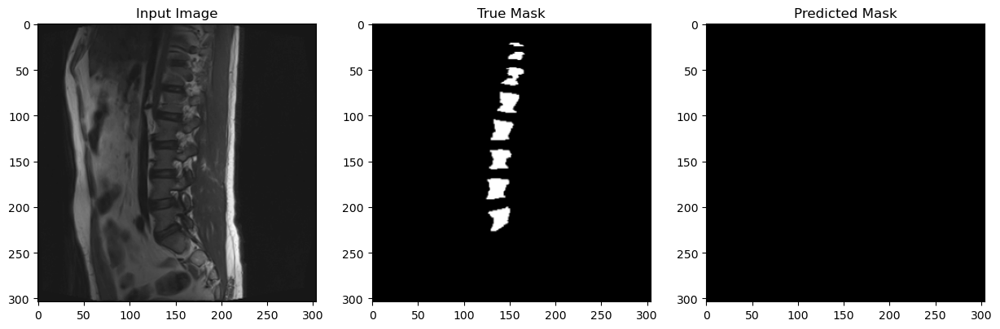

1/1 [==============================] - 0s 106ms/step


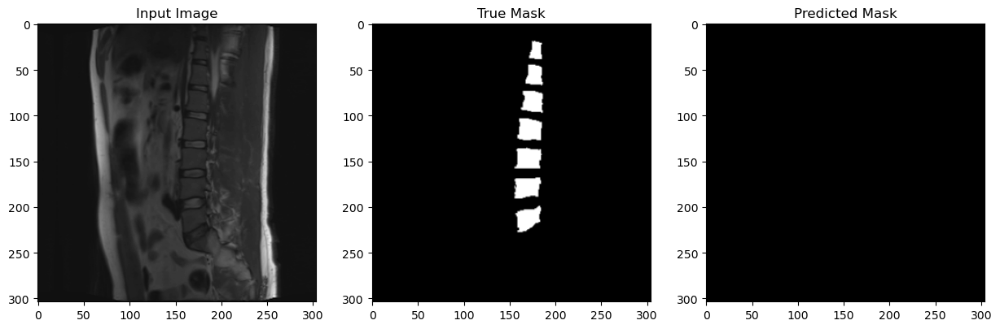

1/1 [==============================] - 0s 132ms/step


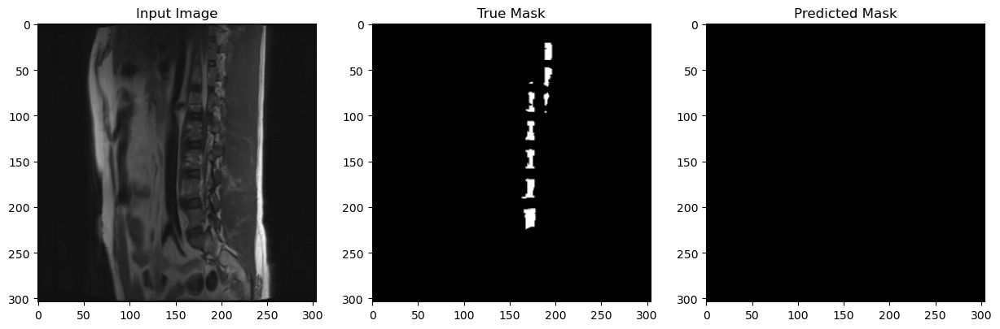

1/1 [==============================] - 0s 130ms/step


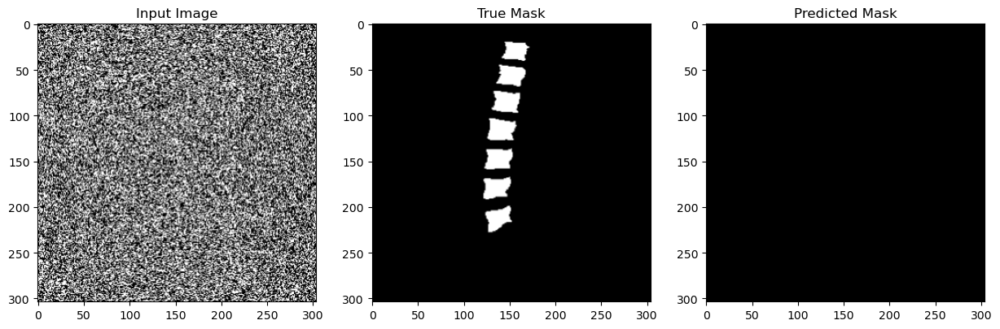

1/1 [==============================] - 0s 127ms/step


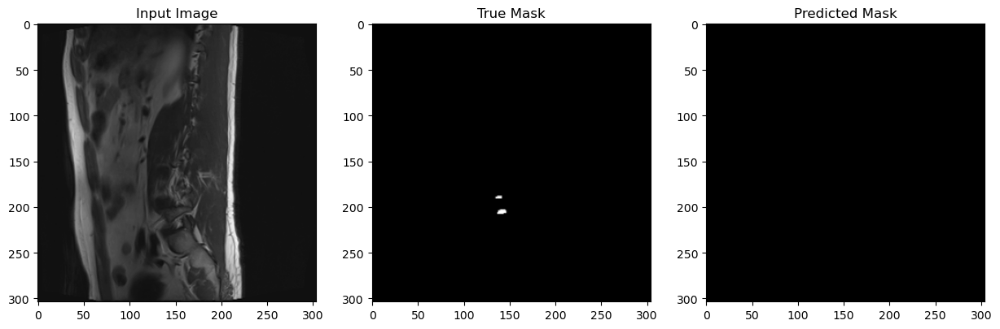

1/1 [==============================] - 0s 126ms/step


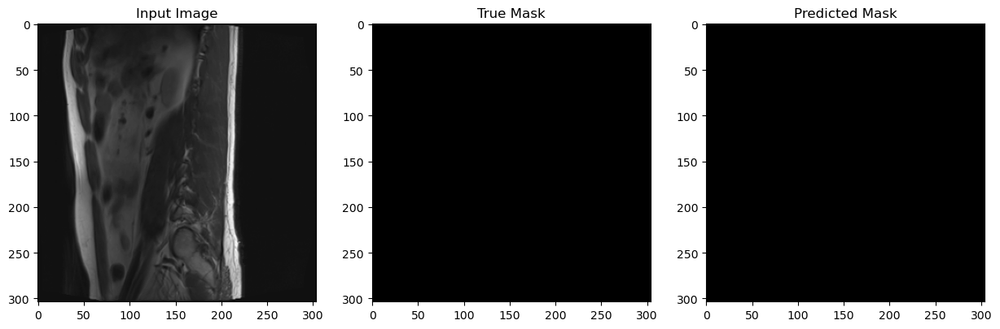

1/1 [==============================] - 0s 130ms/step


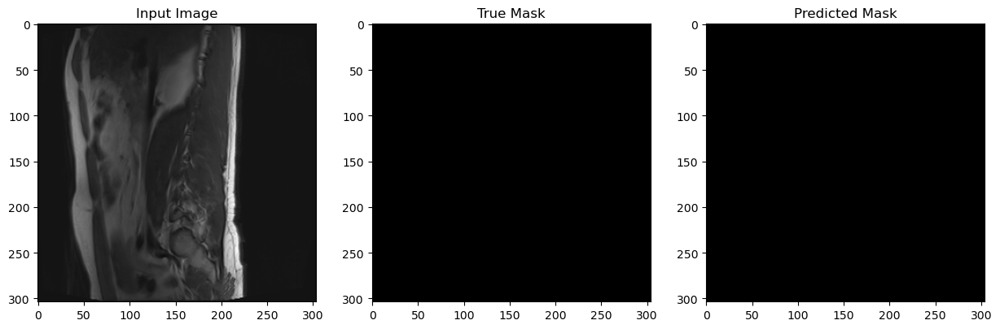

1/1 [==============================] - 0s 128ms/step


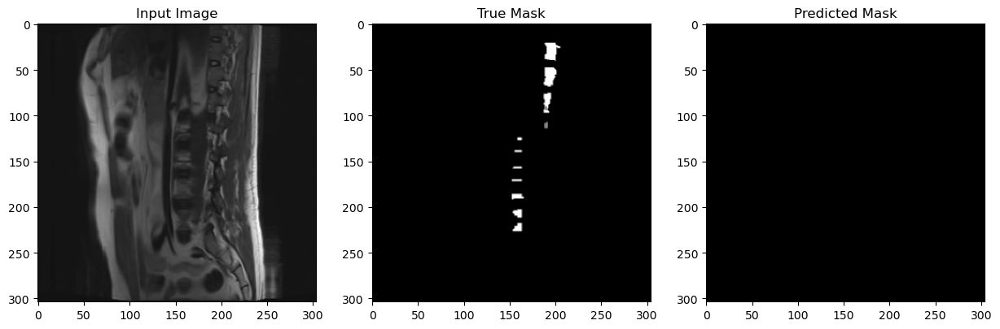

1/1 [==============================] - 0s 124ms/step


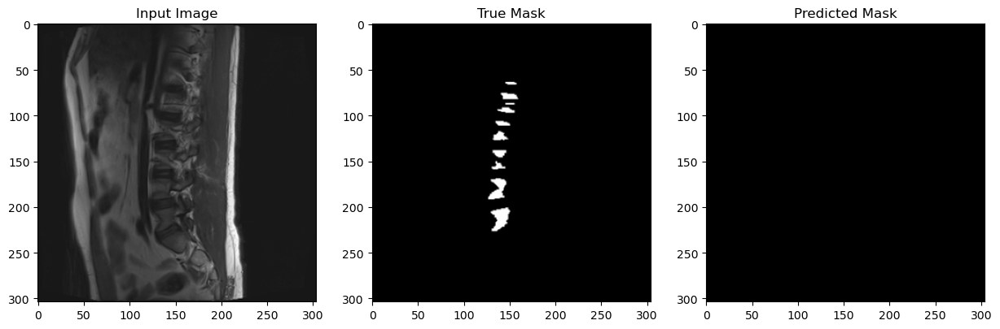

1/1 [==============================] - 0s 120ms/step


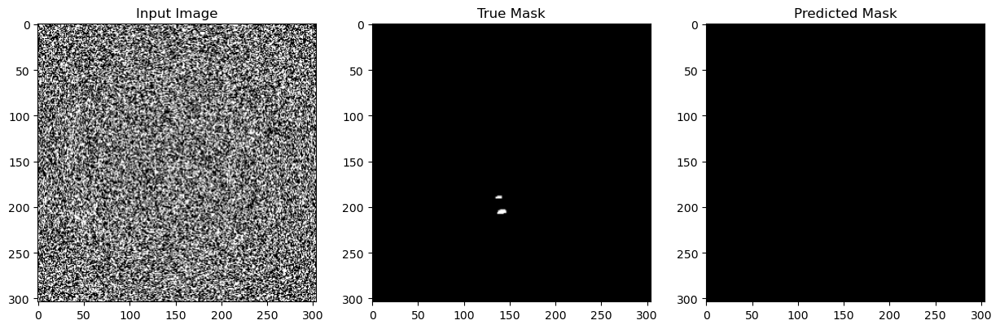

1/1 [==============================] - 0s 130ms/step


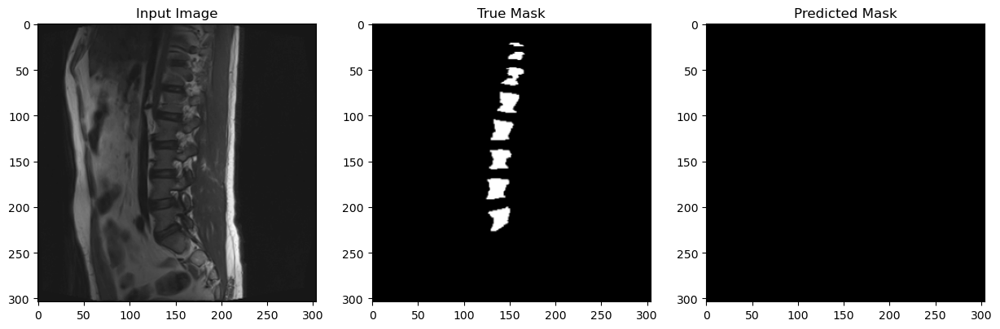

1/1 [==============================] - 0s 128ms/step


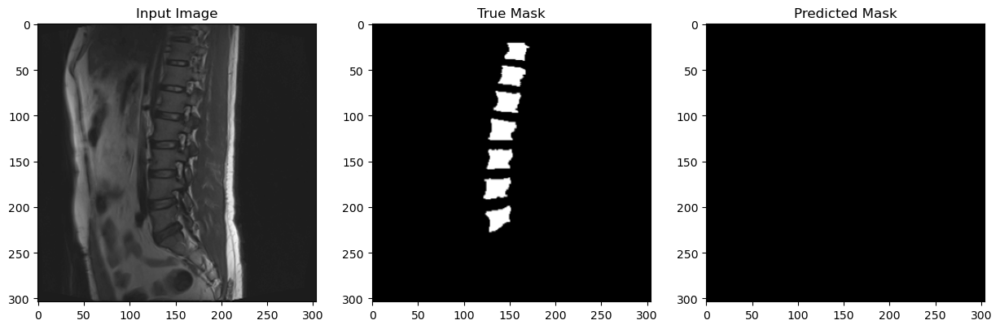

1/1 [==============================] - 0s 130ms/step


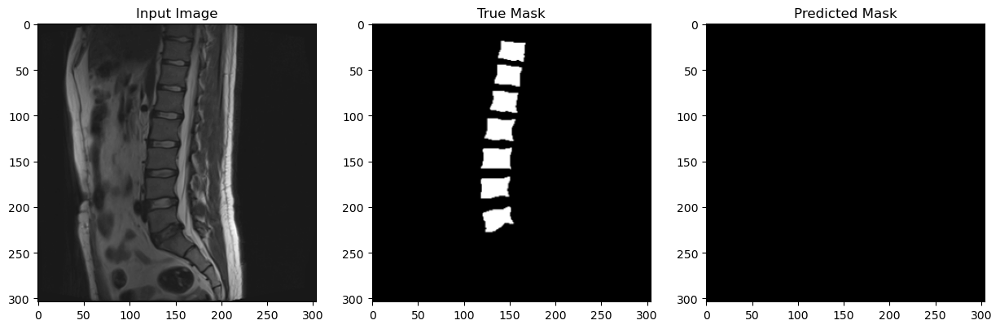

1/1 [==============================] - 0s 104ms/step


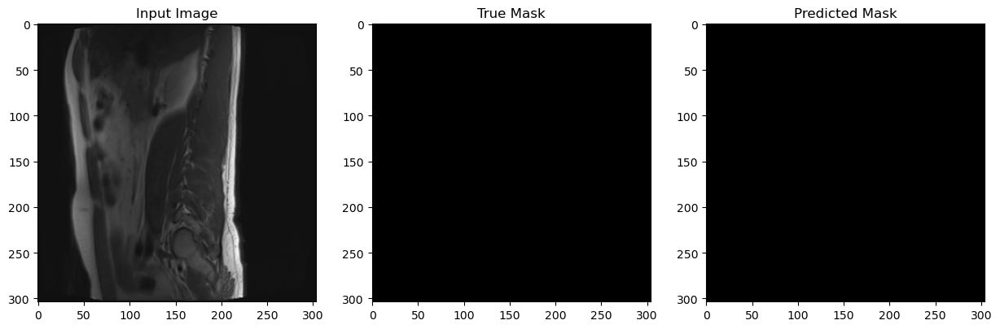

1/1 [==============================] - 0s 131ms/step


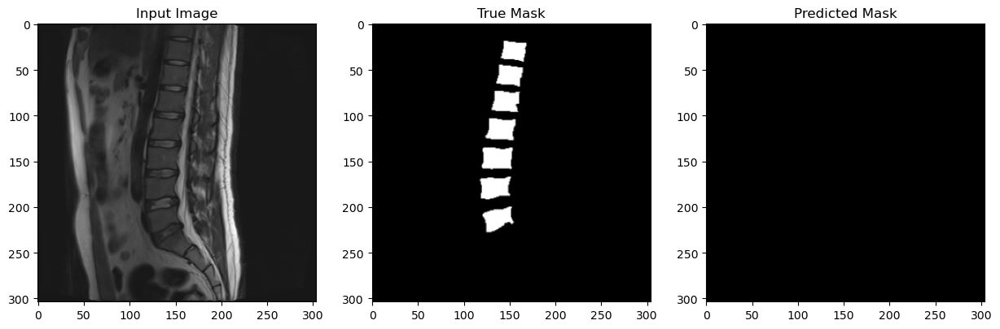

1/1 [==============================] - 0s 129ms/step


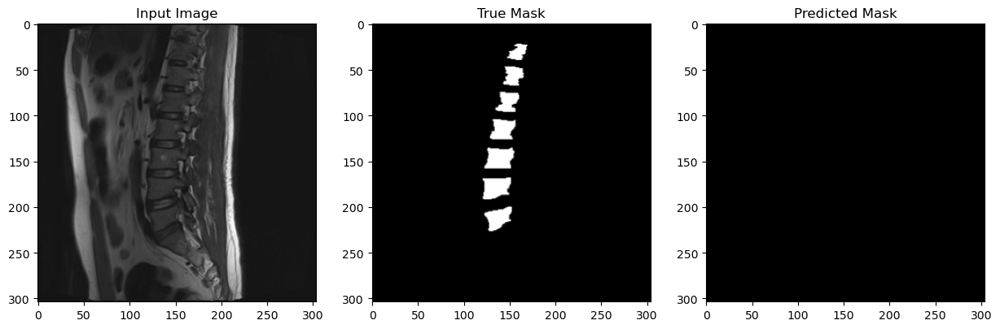

1/1 [==============================] - 0s 129ms/step


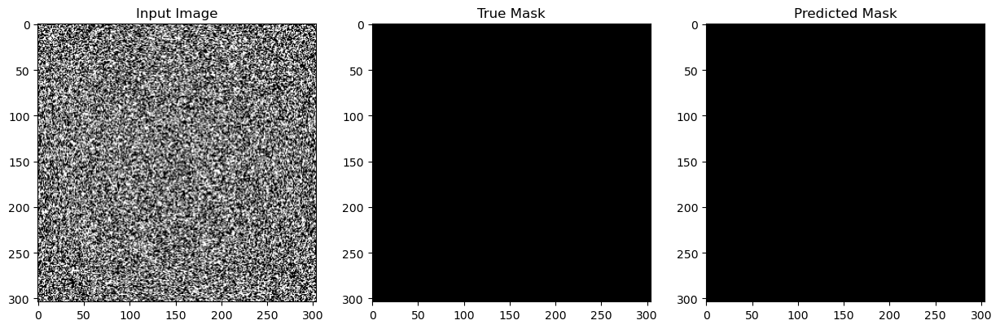

1/1 [==============================] - 0s 125ms/step


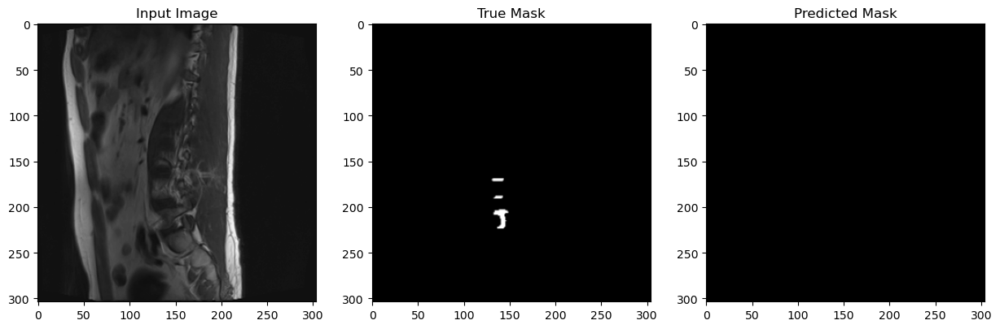

1/1 [==============================] - 0s 153ms/step


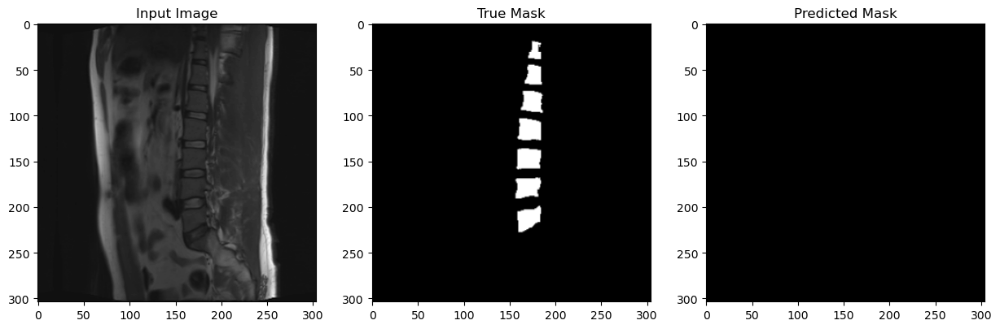

1/1 [==============================] - 0s 131ms/step


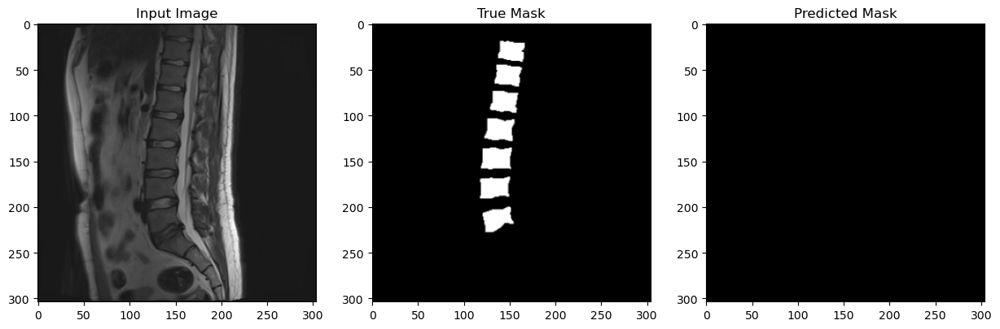

1/1 [==============================] - 0s 127ms/step


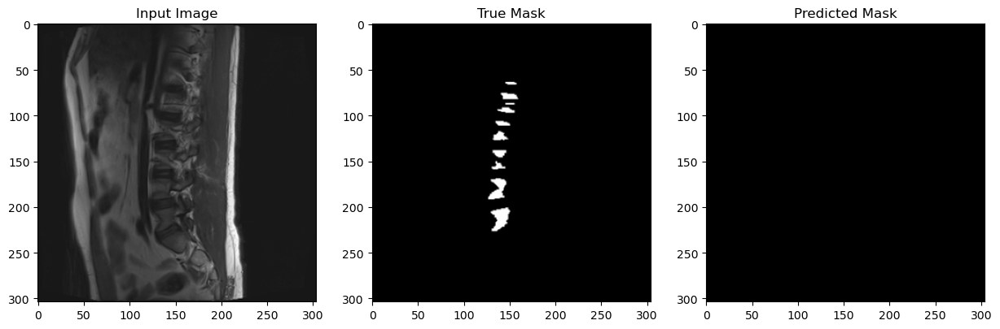

1/1 [==============================] - 0s 133ms/step


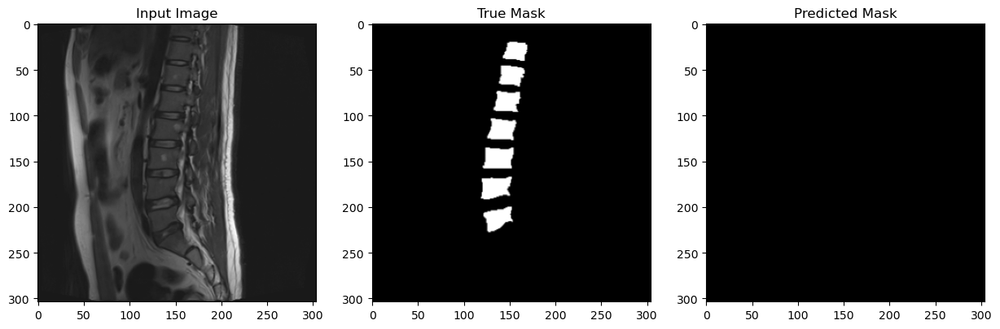

1/1 [==============================] - 0s 132ms/step


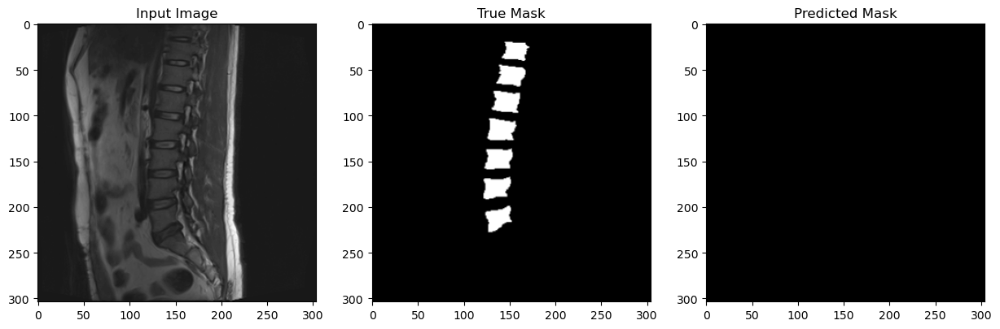

1/1 [==============================] - 0s 125ms/step


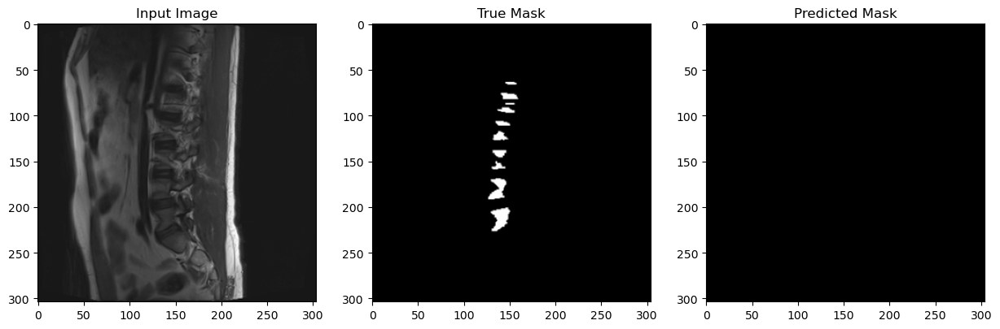

1/1 [==============================] - 0s 126ms/step


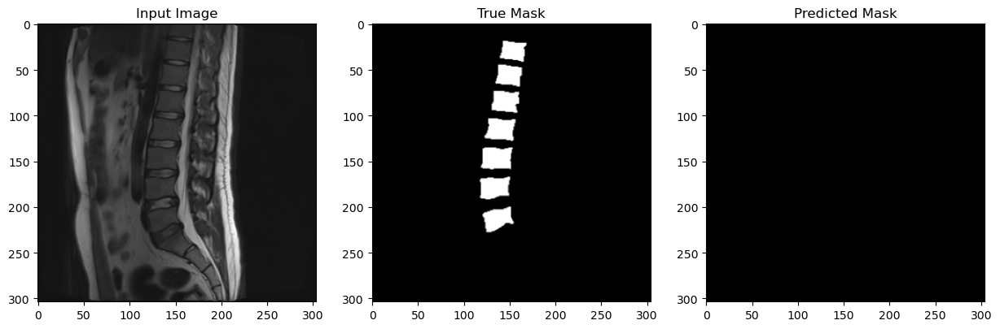

1/1 [==============================] - 0s 103ms/step


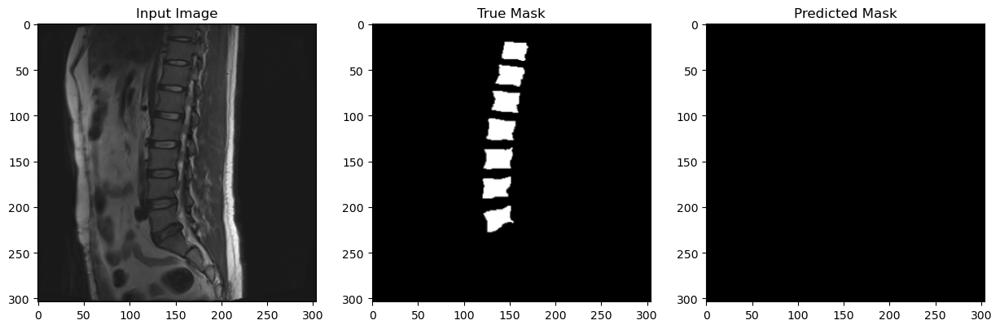

1/1 [==============================] - 0s 132ms/step


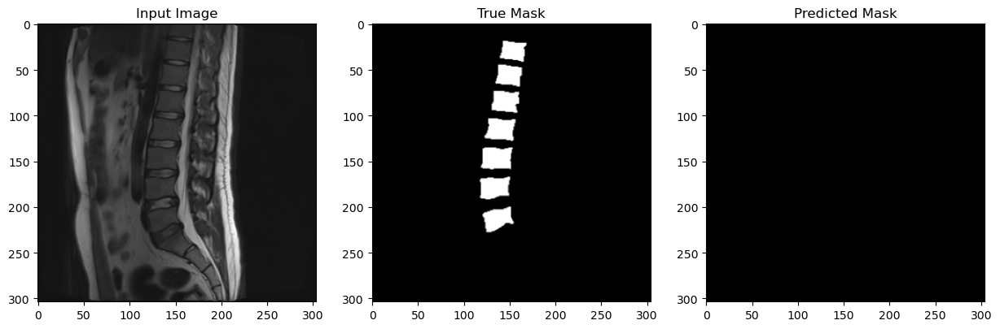

1/1 [==============================] - 0s 129ms/step


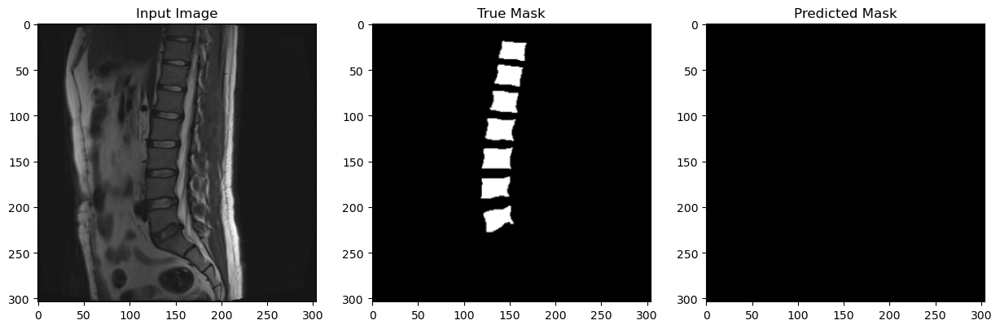

1/1 [==============================] - 0s 126ms/step


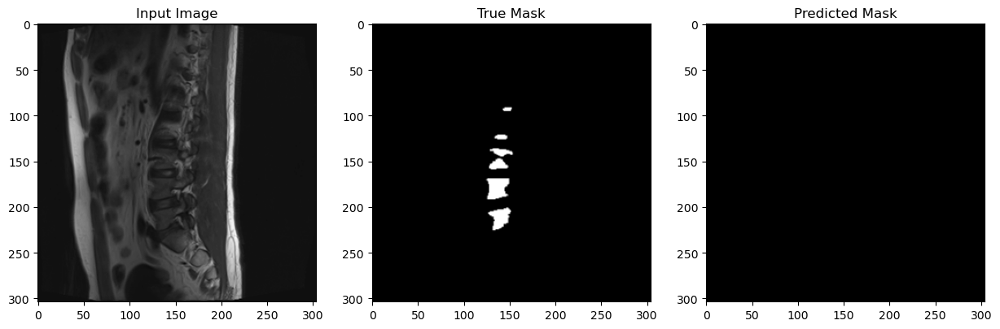

1/1 [==============================] - 0s 130ms/step


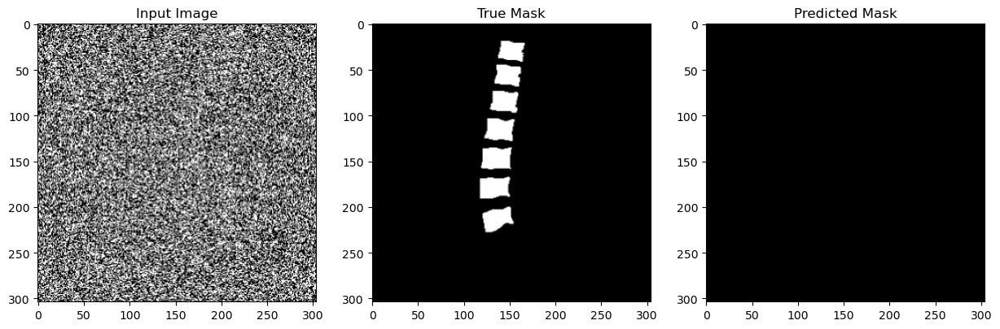

1/1 [==============================] - 0s 129ms/step


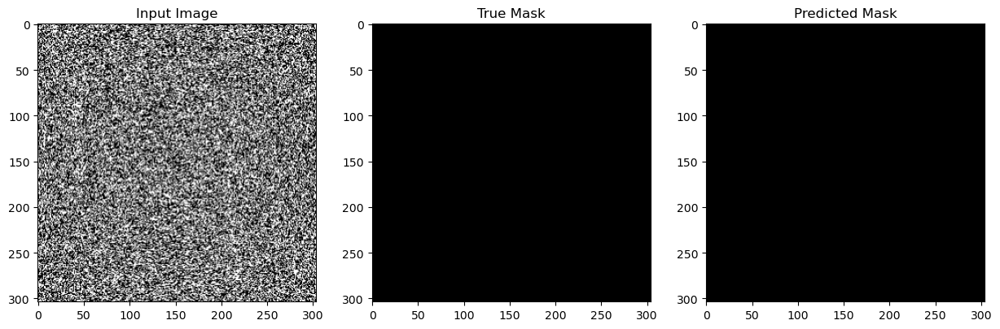

1/1 [==============================] - 0s 131ms/step


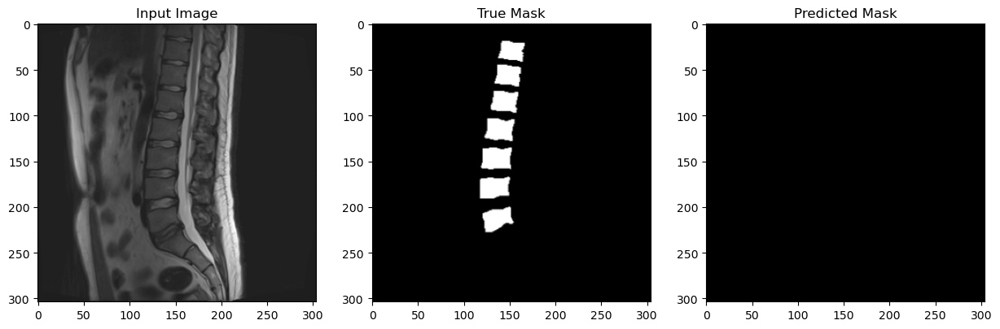

1/1 [==============================] - 0s 131ms/step


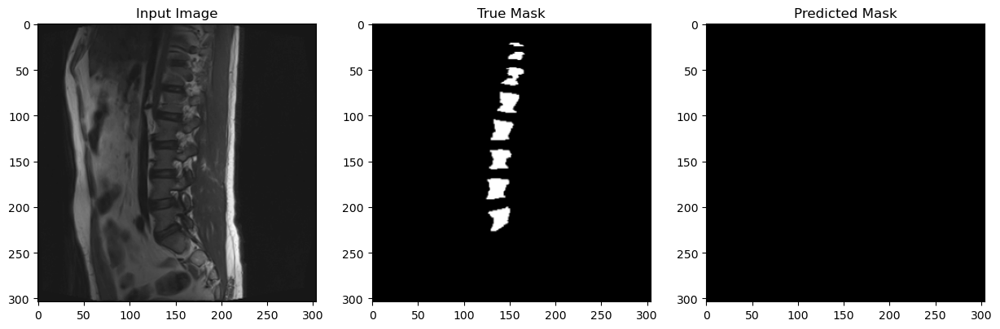

1/1 [==============================] - 0s 126ms/step


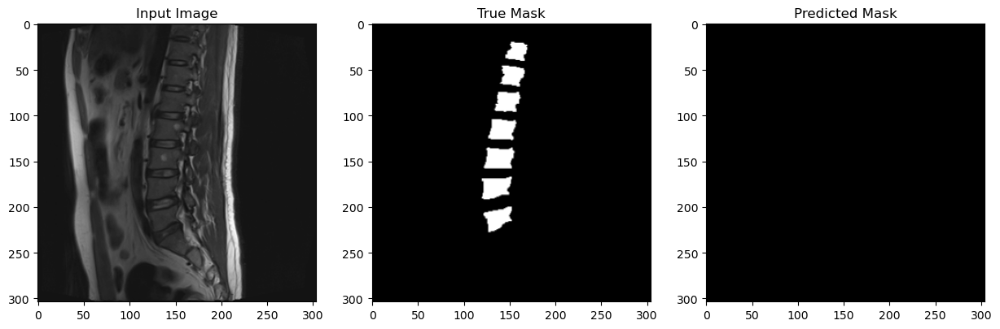

1/1 [==============================] - 0s 132ms/step


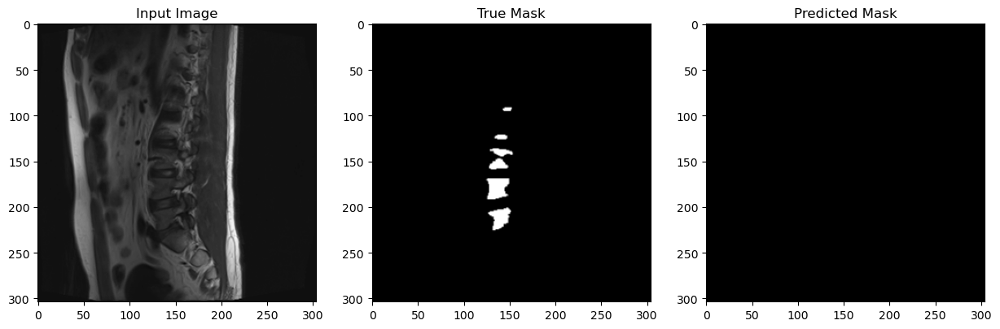

1/1 [==============================] - 0s 132ms/step


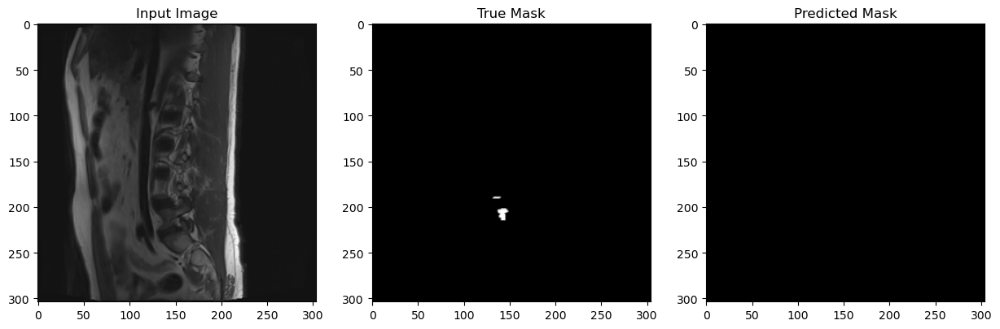

1/1 [==============================] - 0s 133ms/step


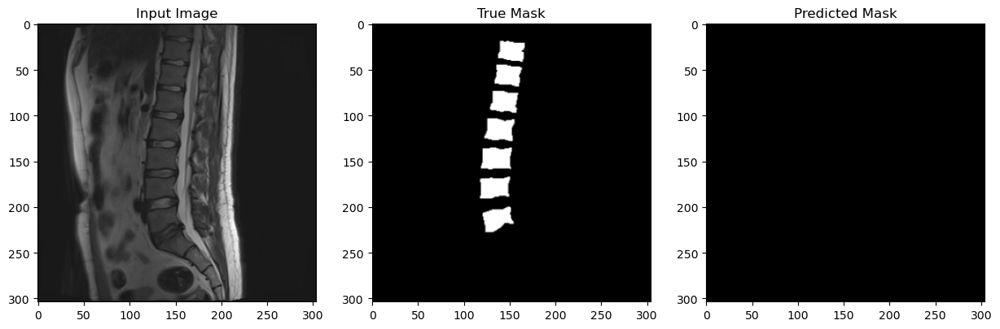

1/1 [==============================] - 0s 133ms/step


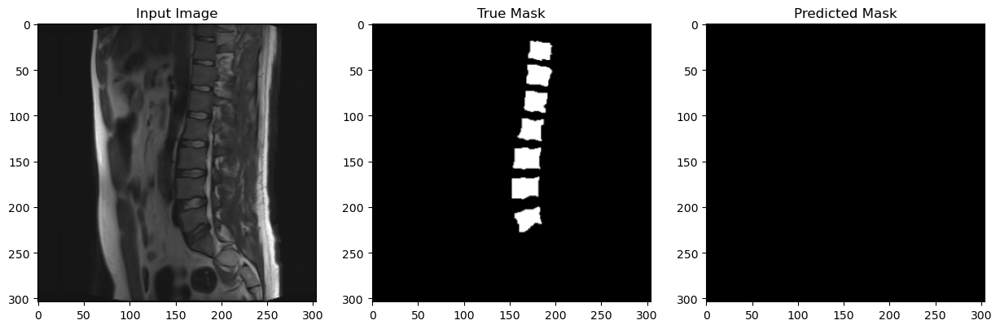

1/1 [==============================] - 0s 127ms/step


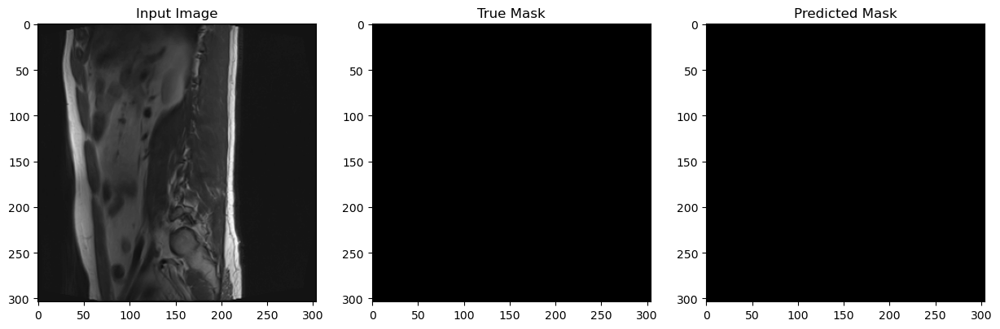

1/1 [==============================] - 0s 129ms/step


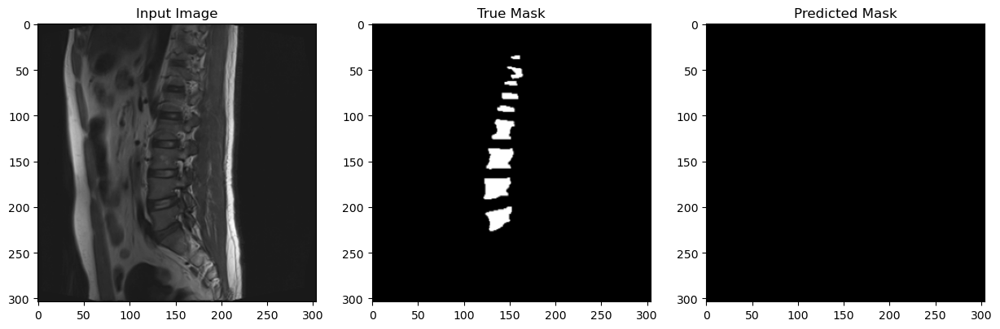

1/1 [==============================] - 0s 130ms/step


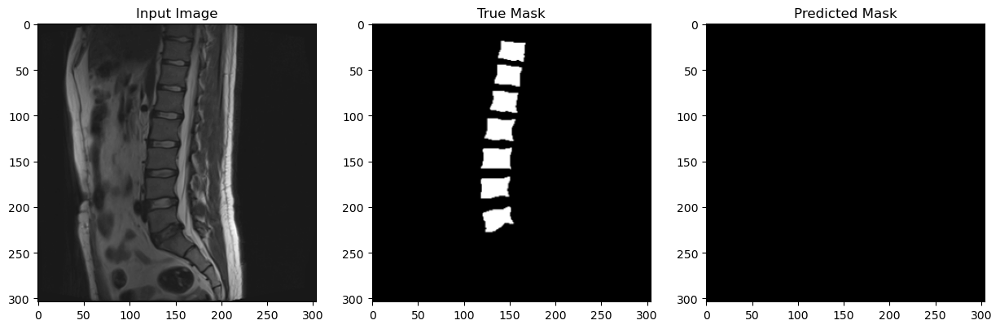

In [17]:

show_prediction(test_generator, 50)

1/1 [==============================] - 3s 3s/step


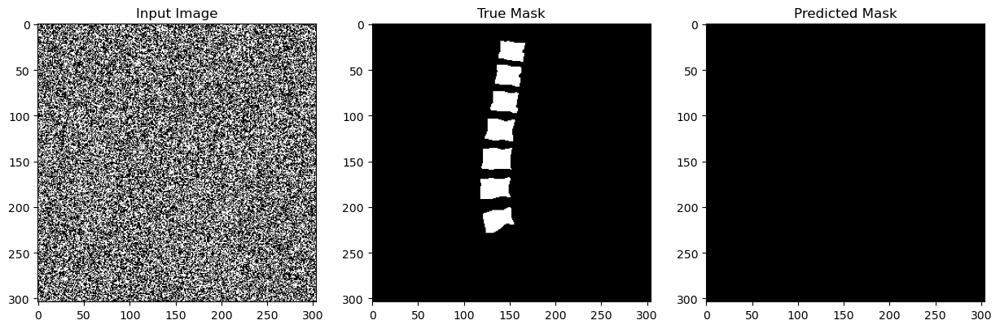

1/1 [==============================] - 3s 3s/step


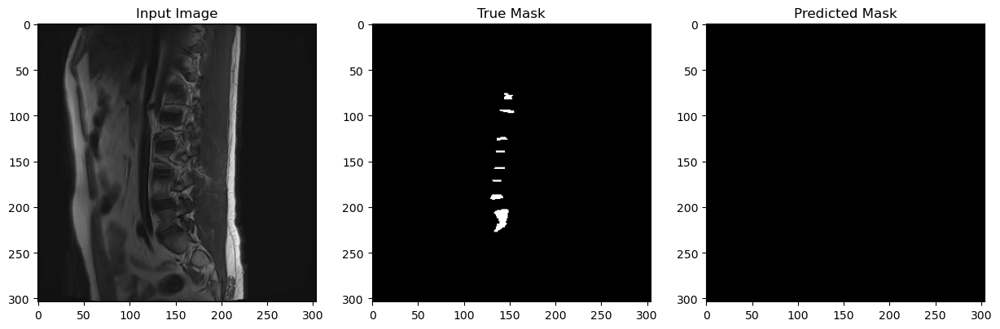

1/1 [==============================] - 3s 3s/step


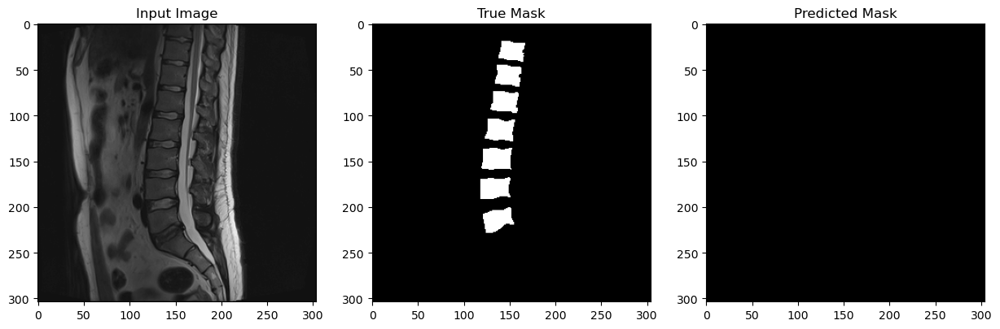

In [18]:
show_prediction(train_generator, 3)



In [19]:
from tensorflow.keras.models import load_model
model_new = load_model('unet.h5')

In [20]:
model_new.summary()

Model: "UNET-L4-F32"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 304, 304, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 304, 304, 32)         320       ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 304, 304, 32)         9248      ['conv2d[0][0]']              
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 152, 152, 32)         0         ['conv2d_1[0][0]']            
 D)                                                                                     

# Prediction

In [35]:
import os
import glob
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
import cv2
#import SimpleITK as sitk
import pandas as pd
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow import keras
import tensorflow as tf

In [21]:
dataInputhPath = 'vertebre/data/volumes'
imagePathInput = os.path.join(dataInputhPath, 'image')
maskPathInput = os.path.join(dataInputhPath, 'mask')

dataOutPutPath = 'vertebre/data/slices'
imagesSlicesOutput = os.path.join(dataOutPutPath, 'img' )
maskSlicesOutput = os.path.join(dataOutPutPath, 'mask')

In [27]:
from glob import glob


from albumentations import (
    RandomRotate90,
    Flip,
    Transpose,
    ElasticTransform,
)
from tqdm import tqdm

def normalize_data(data):
    # Normalisation des données entre 0 et 1
    data_min = np.min(data)
    data_max = np.max(data)
    normalized_data = (data - data_min) / (data_max - data_min)
    return normalized_data

def augment_data(image_mask_pairs, save_path, augment=True):
    # Définir les transformations possibles
    transformations = [
        RandomRotate90(p=0.5),
        Flip(p=0.5),
        Transpose(p=0.5),
        ElasticTransform(p=0.5, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03),
    ]

    for idx, (image_path, mask_path) in tqdm(enumerate(image_mask_pairs), total=len(image_mask_pairs)):
        # Lecture de l'image et du masque
        image_data = nib.load(image_path).get_fdata()
        mask_data = nib.load(mask_path).get_fdata()

        # Normalisation des données
        image_data_normalized = normalize_data(image_data)
        mask_data_normalized = normalize_data(mask_data)

        if augment:
            for transform in transformations:
                # Appliquer la transformation à l'image et au masque
                augmented = transform(image=image_data_normalized, mask=mask_data_normalized)
                augmented_image = augmented["image"]
                augmented_mask = augmented["mask"]

                # Sauvegarder l'image et le masque augmentés ensemble
                save_augmented_data(augmented_image, augmented_mask, idx, save_path, transform.__class__.__name__)
        else:
            # Sauvegarder l'image et le masque non augmentés ensemble
            save_augmented_data(image_data_normalized, mask_data_normalized, idx, save_path, "original")

def save_augmented_data(image, mask, idx, save_path, transform_name):
    # Créer un dossier pour sauvegarder les données augmentées
    augmented_folder = os.path.join(save_path, transform_name)
    os.makedirs(augmented_folder, exist_ok=True)

    # Créer les noms de fichiers pour l'image et le masque
    image_name = f"image_{idx}.nii"
    mask_name = f"mask_{idx}.nii"

    # Sauvegarder l'image et le masque augmentés ensemble
    image_path = os.path.join(augmented_folder, image_name)
    mask_path = os.path.join(augmented_folder, mask_name)
    nib.save(nib.Nifti1Image(image, np.eye(4)), image_path)
    nib.save(nib.Nifti1Image(mask, np.eye(4)), mask_path)



# Chemin du répertoire contenant les images
image_dir = imagePathInput
mask_dir = maskPathInput

# Rechercher tous les fichiers d'images et de masques dans les répertoires respectifs
image_files = glob(os.path.join(image_dir, '*.nii'))
mask_files = glob(os.path.join(mask_dir, '*.nii'))

# Associer chaque image à son masque correspondant
image_mask_pairs = [(image_file, mask_file) for image_file, mask_file in zip(image_files, mask_files)]

# Chemin de sortie pour les données augmentées
output_path = 'vert/augmented'

# Appeler la fonction augment_data avec les arguments appropriés
augment_data(image_mask_pairs, output_path)

100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  3.73it/s]


In [29]:
import os
import shutil

def organize_data(source_dir, destination_dir):
    # Créer les dossiers images et masks
    os.makedirs(os.path.join(destination_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(destination_dir, 'masks'), exist_ok=True)

    # Liste des dossiers d'augmentation
    augmentation_folders = os.listdir(source_dir)

    # Parcourir chaque dossier d'augmentation
    for augmentation_folder in augmentation_folders:
        # Chemin complet vers le dossier de l'augmentation
        augmentation_path = os.path.join(source_dir, augmentation_folder)
        
        # Liste des fichiers d'images dans le dossier d'augmentation
        image_files = [f for f in os.listdir(augmentation_path) if f.startswith('image') and f.endswith('.nii')]
        
        # Copier les fichiers d'images dans le dossier images du répertoire de destination
        for image_file in image_files:
            shutil.copy(os.path.join(augmentation_path, image_file), os.path.join(destination_dir, 'images', f'{augmentation_folder}_{image_file}'))
        
        # Liste des fichiers de masques dans le dossier d'augmentation
        mask_files = [f for f in os.listdir(augmentation_path) if f.startswith('mask') and f.endswith('.nii')]
        
        # Copier les fichiers de masques dans le dossier masks du répertoire de destination
        for mask_file in mask_files:
            shutil.copy(os.path.join(augmentation_path, mask_file), os.path.join(destination_dir, 'masks', f'{augmentation_folder}_{mask_file}'))

# Définir les répertoires source et destination
source_dir = 'vert/augmented'
destination_dir = 'vert/organized_data'

# Organiser les données
organize_data(source_dir, destination_dir)


In [30]:
SEED = 909
BATCH_SIZE_TRAIN = 32
BATCH_SIZE_TEST = 32

IMAGE_HEIGHT = 304
IMAGE_WIDTH = 304
IMG_SIZE = (IMAGE_HEIGHT, IMAGE_WIDTH)
NUM_TRAIN = 71



NUM_TEST = 71
NUM_OF_EPOCHS = 10



# Chemins d'accès aux données
dataInputPath = 'vert/organized_data/'
imagePathInput = os.path.join(dataInputPath, 'images/')
maskPathInput = os.path.join(dataInputPath, 'masks/')

# Définition des chemins de sortie pour les coupes d'image et de masque
sliceOutputPath = 'vert/data/slices/'
imageSliceOutput = os.path.join(sliceOutputPath, 'img/')
maskSliceOutput = os.path.join(sliceOutputPath, 'mask/')

# Assurez-vous que les répertoires de sortie existent, sinon les créez
os.makedirs(imageSliceOutput, exist_ok=True)
os.makedirs(maskSliceOutput, exist_ok=True)

# STEP 3 - Slicing and saving
SLICE_X = True
SLICE_Y = False
SLICE_Z = False

SLICE_DECIMATE_IDENTIFIER = 3

In [31]:
# Fonction de lecture d'un volume d'image
def readImageVolume(imgPath, normalize=False):
    img = nib.load(imgPath).get_fdata()
    return img

In [32]:
# Fonction pour enregistrer une coupe d'image
def saveSlice(img, fname, path):
    img = np.uint8(img * 255)
    fout = os.path.join(path, f'{fname}.png')
    cv2.imwrite(fout, img.T[::-1])
    print(f'[+] Slice saved: {fout}', end='\r')

In [33]:
# Fonction pour découper et enregistrer toutes les coupes d'une image dans toutes les directions
def sliceAndSaveVolumeImage(vol, fname, path):
    (dimx, dimy, dimz) = vol.shape
    print(dimx, dimy, dimz)
    cnt = 0
    if SLICE_X:
        cnt += dimx
        print('Slicing X: ')
        for i in range(dimx):
            saveSlice(vol[i,:,:], fname+f'-slice{str(i).zfill(SLICE_DECIMATE_IDENTIFIER)}_x', path)
            
    if SLICE_Y:
        cnt += dimy
        print('Slicing Y: ')
        for i in range(dimy):
            saveSlice(vol[:,i,:], fname+f'-slice{str(i).zfill(SLICE_DECIMATE_IDENTIFIER)}_y', path)
            
    if SLICE_Z:
        cnt += dimz
        print('Slicing Z: ')
        for i in range(dimz):
            saveSlice(vol[:,:,i], fname+f'-slice{str(i).zfill(SLICE_DECIMATE_IDENTIFIER)}_z', path)
    return cnt


In [38]:
# Fonction pour découper et enregistrer toutes les coupes d'une image dans toutes les directions
def sliceAndSaveVolumeImage(vol, fname, path):
    (dimx, dimy, dimz) = vol.shape
    print(dimx, dimy, dimz)
    cnt = 0
    if SLICE_X:
        cnt += dimx
        print('Slicing X: ')
        for i in range(dimx):
            saveSlice(vol[i,:,:], fname+f'-slice{str(i).zfill(SLICE_DECIMATE_IDENTIFIER)}_x', path)
            
    if SLICE_Y:
        cnt += dimy
        print('Slicing Y: ')
        for i in range(dimy):
            saveSlice(vol[:,i,:], fname+f'-slice{str(i).zfill(SLICE_DECIMATE_IDENTIFIER)}_y', path)
            
    if SLICE_Z:
        cnt += dimz
        print('Slicing Z: ')
        for i in range(dimz):
            saveSlice(vol[:,:,i], fname+f'-slice{str(i).zfill(SLICE_DECIMATE_IDENTIFIER)}_z', path)
    return cnt


vert/organized_data/images/ElasticTransform_image_0.nii (39, 305, 305) 649 0.03099661683292488 0.954851814944368
39 305 305
Slicing X: 
[+] Slice saved: vert/data/slices/img/tooth0-slice038_x.png
vert/organized_data/images/ElasticTransform_image_0.nii, 39 slices created 

vert/organized_data/images/ElasticTransform_image_1.nii (39, 305, 305) 649 0.0 1.0
39 305 305
Slicing X: 
[+] Slice saved: vert/data/slices/img/tooth1-slice038_x.png
vert/organized_data/images/ElasticTransform_image_1.nii, 39 slices created 

vert/organized_data/images/ElasticTransform_image_2.nii (39, 305, 305) 649 0.04531915591714161 0.9344937677591877
39 305 305
Slicing X: 
[+] Slice saved: vert/data/slices/img/tooth2-slice038_x.png
vert/organized_data/images/ElasticTransform_image_2.nii, 39 slices created 

vert/organized_data/images/ElasticTransform_image_3.nii (39, 305, 305) 649 0.06213745889784414 0.9126279238702996
39 305 305
Slicing X: 
[+] Slice saved: vert/data/slices/img/tooth3-slice038_x.png
vert/organize

In [40]:
import glob

# Lecture et traitement des volumes d'images
for index, filename in enumerate(sorted(glob.iglob(maskPathInput + '*.nii'))):
    mask = readImageVolume(filename, False)
    print(filename, mask.shape, np.sum(mask.shape), np.min(mask), np.max(mask))
    numOfMaskSlices = sliceAndSaveVolumeImage(mask, 'mask' + str(index), maskSliceOutput)
    print(f'\n{filename}, {numOfMaskSlices} slices created \n')



vert/organized_data/masks/ElasticTransform_mask_0.nii (39, 305, 305) 649 0.0 1.0
39 305 305
Slicing X: 
[+] Slice saved: vert/data/slices/mask/mask0-slice038_x.png
vert/organized_data/masks/ElasticTransform_mask_0.nii, 39 slices created 

vert/organized_data/masks/ElasticTransform_mask_1.nii (39, 305, 305) 649 0.0 1.0
39 305 305
Slicing X: 
[+] Slice saved: vert/data/slices/mask/mask1-slice038_x.png
vert/organized_data/masks/ElasticTransform_mask_1.nii, 39 slices created 

vert/organized_data/masks/ElasticTransform_mask_2.nii (39, 305, 305) 649 0.0 1.0
39 305 305
Slicing X: 
[+] Slice saved: vert/data/slices/mask/mask2-slice038_x.png
vert/organized_data/masks/ElasticTransform_mask_2.nii, 39 slices created 

vert/organized_data/masks/ElasticTransform_mask_3.nii (39, 305, 305) 649 0.0 1.0
39 305 305
Slicing X: 
[+] Slice saved: vert/data/slices/mask/mask3-slice038_x.png
vert/organized_data/masks/ElasticTransform_mask_3.nii, 39 slices created 

vert/organized_data/masks/ElasticTransform_m

In [41]:
def create_segmentation_generator_train(img_path, msk_path, BATCH_SIZE):
    data_gen_args = dict(rescale=1./255
#                      featurewise_center=True,
#                      featurewise_std_normalization=True,
#                      rotation_range=90
#                      width_shift_range=0.2,
#                      height_shift_range=0.2,
#                      zoom_range=0.3

                        )
    datagen = ImageDataGenerator(**data_gen_args)
    
    img_generator = datagen.flow_from_directory(img_path, target_size=IMG_SIZE, class_mode=None, color_mode='grayscale', batch_size=BATCH_SIZE, seed=SEED)
    msk_generator = datagen.flow_from_directory(msk_path, target_size=IMG_SIZE, class_mode=None, color_mode='grayscale', batch_size=BATCH_SIZE, seed=SEED)
    return zip(img_generator, msk_generator)

In [43]:
train_generator = create_segmentation_generator_train(imageSliceOutput, maskSliceOutput, BATCH_SIZE_TRAIN)

Found 1844 images belonging to 1 classes.
Found 1844 images belonging to 1 classes.


In [44]:
def show_prediction(datagen, num=1):
    for i in range(0,num):
        image,mask = next(datagen)
        pred_mask = model.predict(image)[0] > 0.5
        display([image[0], mask[0], pred_mask])

1/1 [==============================] - 3s 3s/step


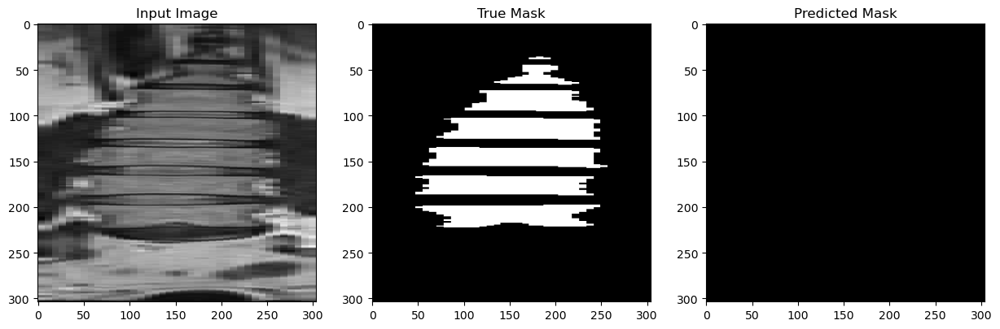

1/1 [==============================] - 3s 3s/step


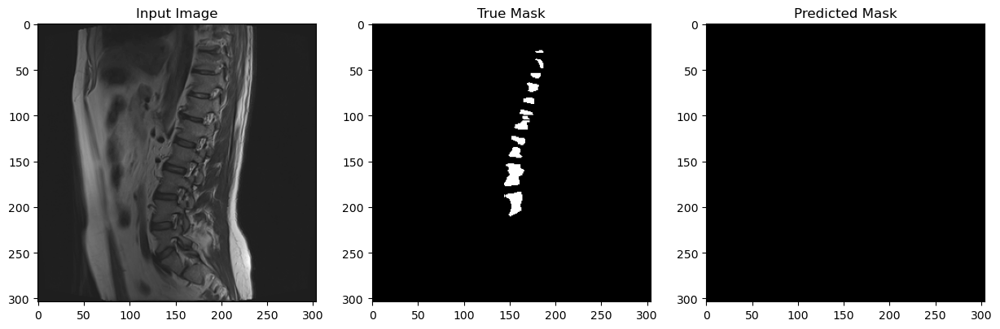

1/1 [==============================] - 3s 3s/step


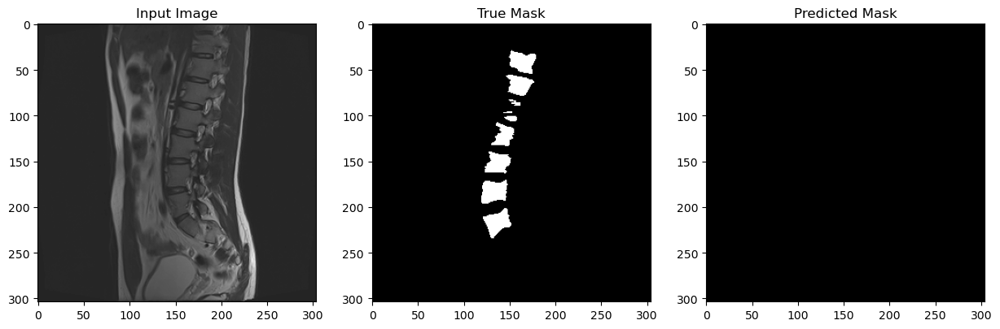

1/1 [==============================] - 3s 3s/step


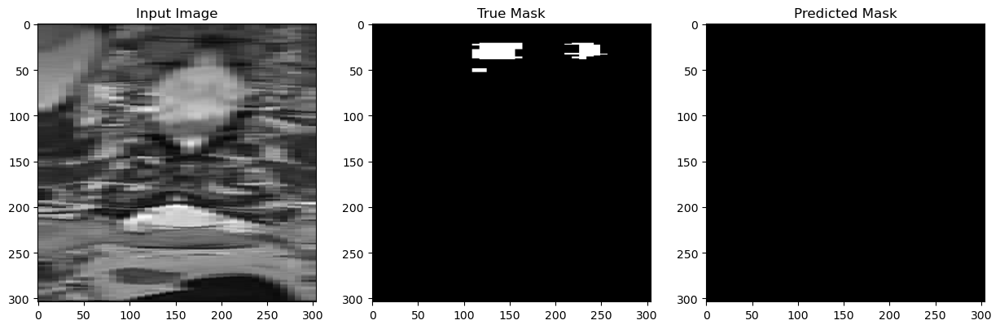

1/1 [==============================] - 3s 3s/step


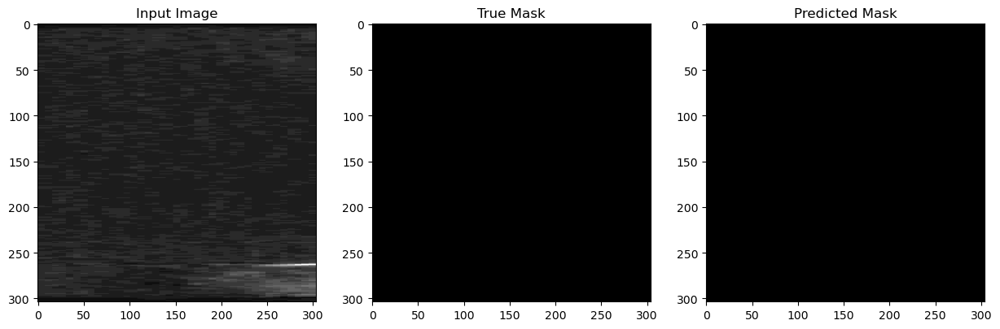

1/1 [==============================] - 3s 3s/step


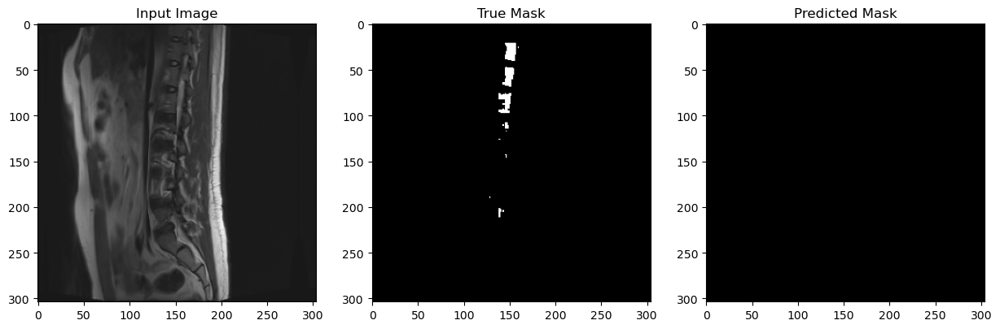

1/1 [==============================] - 3s 3s/step


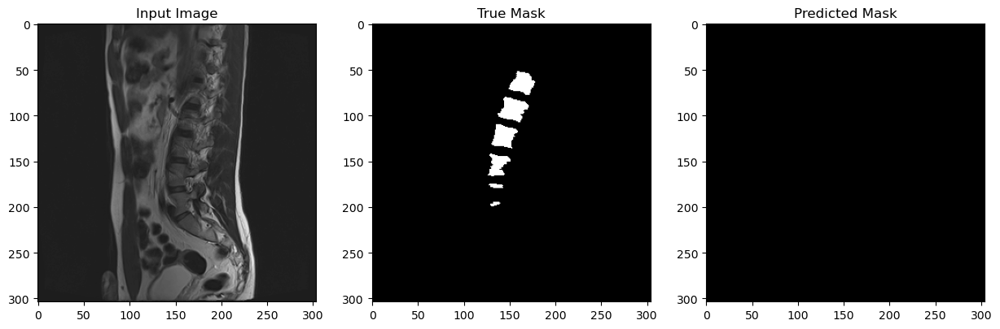

1/1 [==============================] - 3s 3s/step


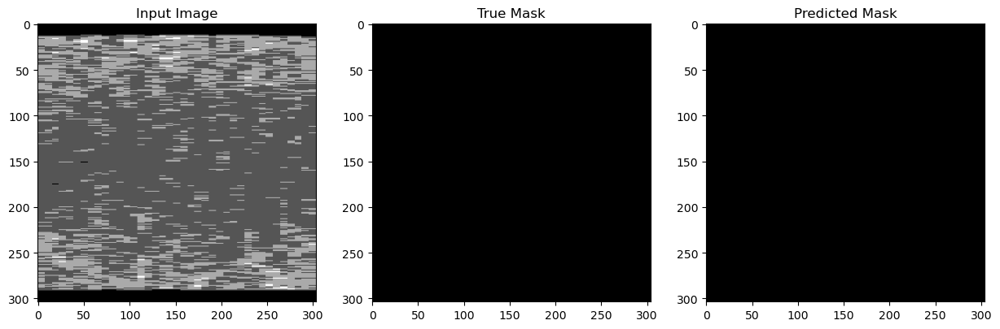

1/1 [==============================] - 3s 3s/step


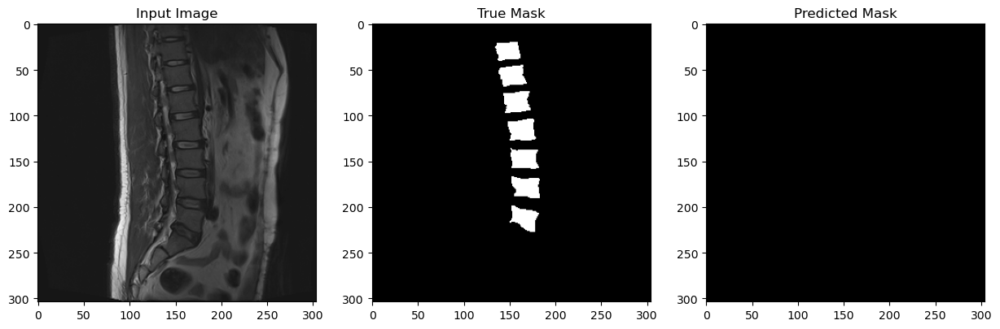

1/1 [==============================] - 3s 3s/step


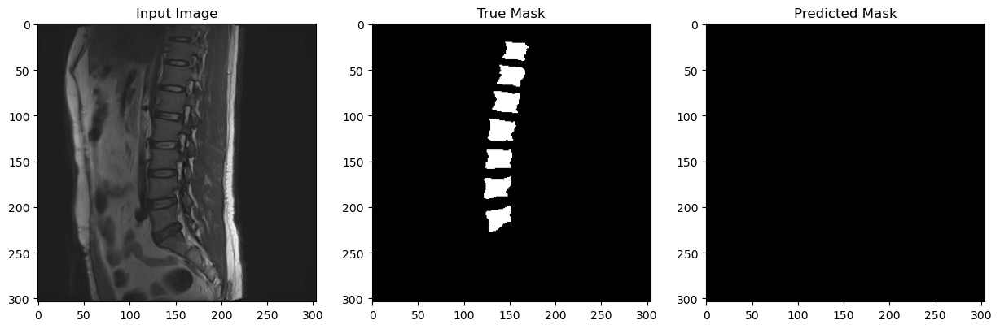

1/1 [==============================] - 3s 3s/step


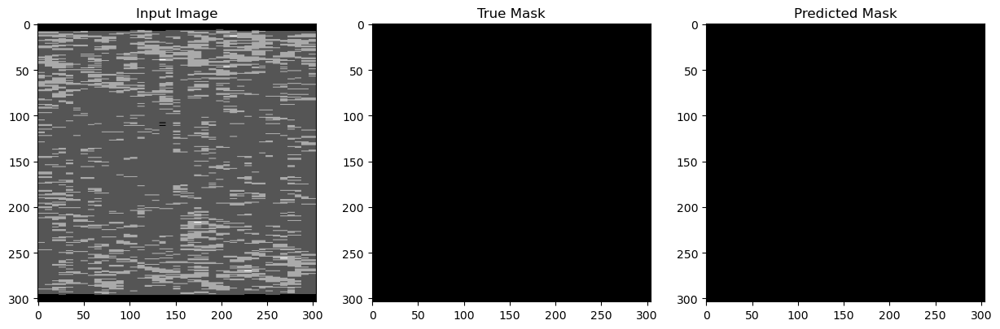

1/1 [==============================] - 3s 3s/step


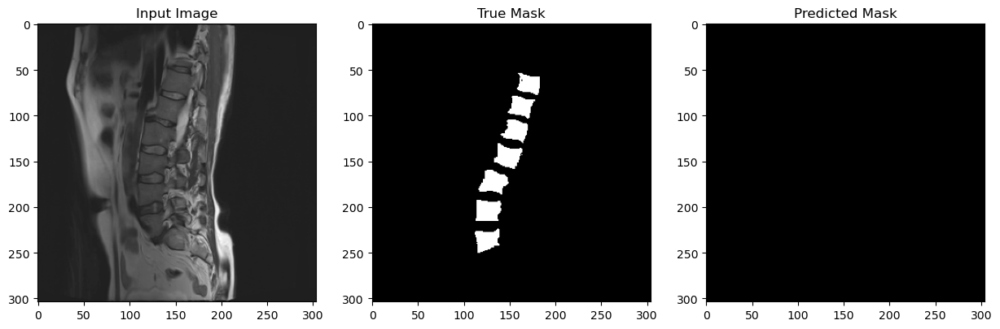

1/1 [==============================] - 3s 3s/step


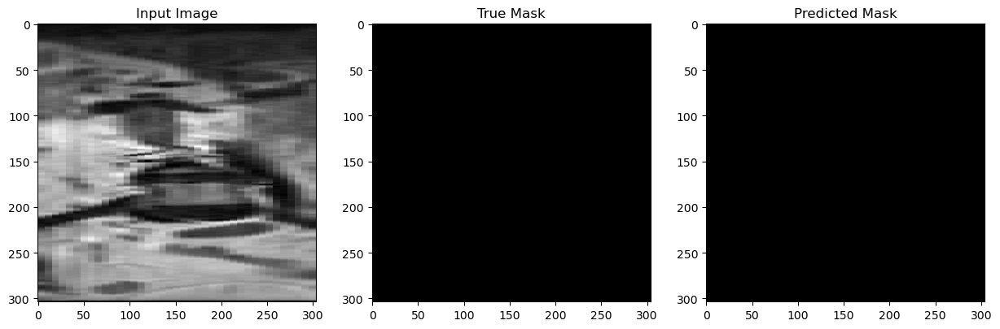

1/1 [==============================] - 3s 3s/step


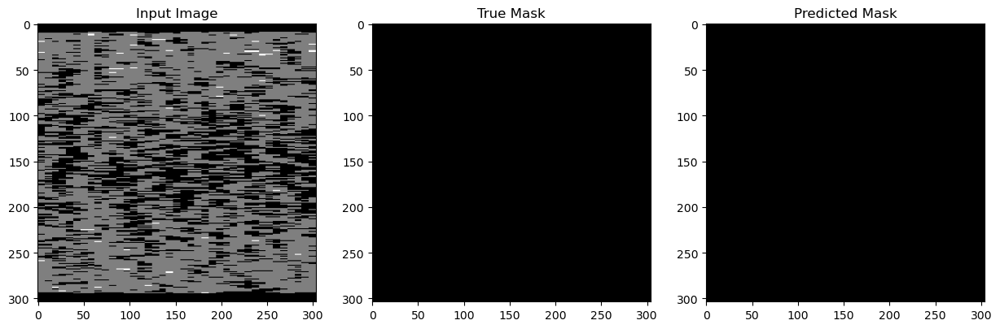

1/1 [==============================] - 3s 3s/step


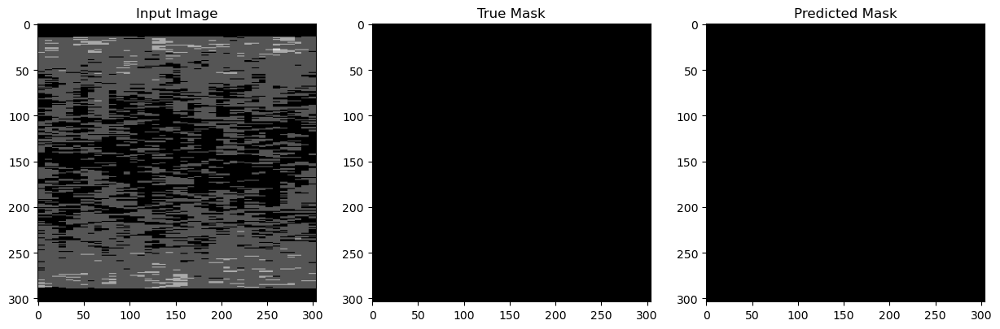

1/1 [==============================] - 3s 3s/step


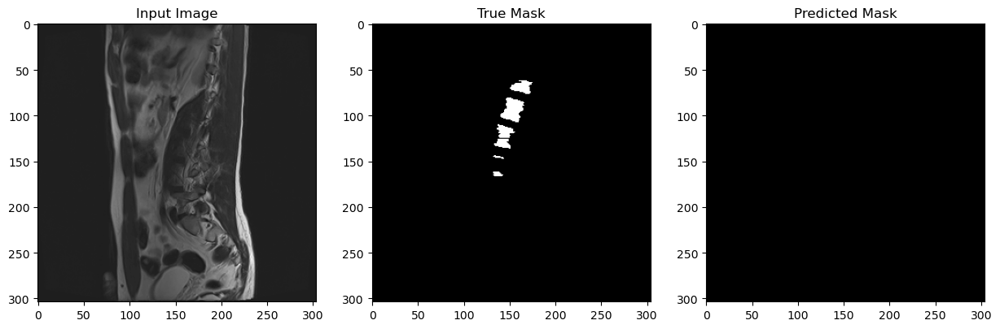

1/1 [==============================] - 3s 3s/step


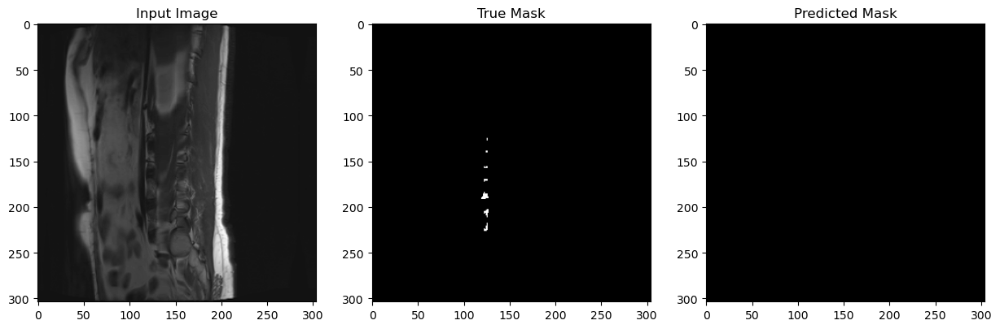

1/1 [==============================] - 3s 3s/step


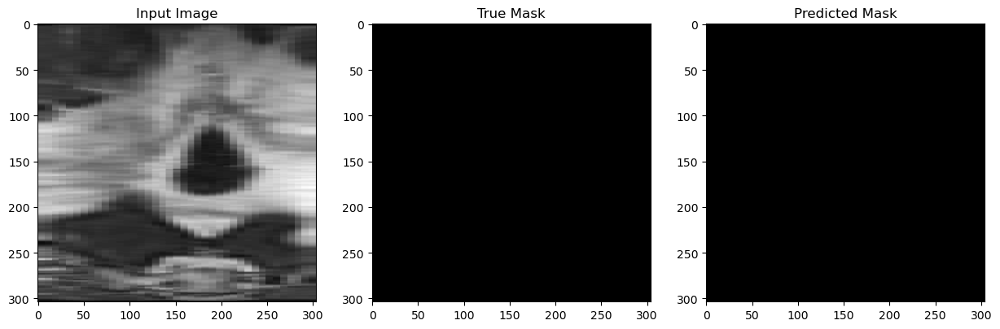

1/1 [==============================] - 3s 3s/step


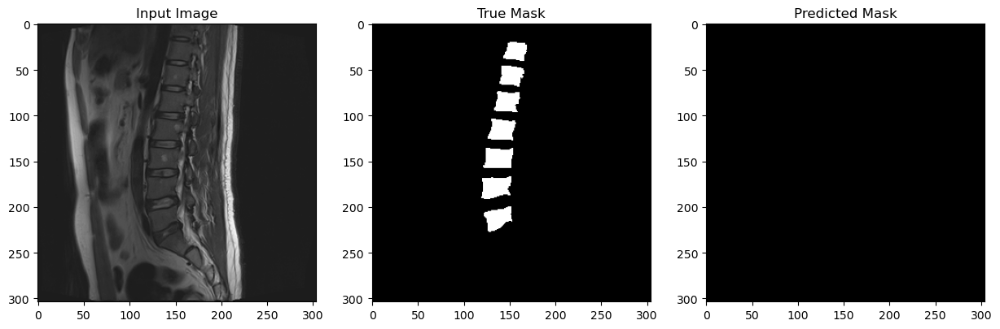

1/1 [==============================] - 3s 3s/step


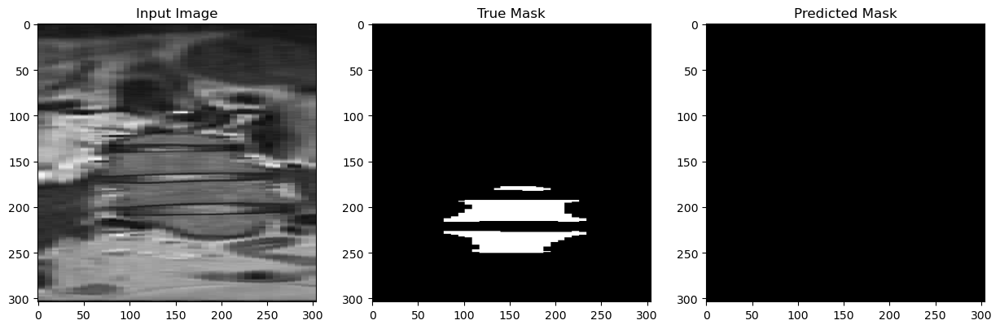

1/1 [==============================] - 3s 3s/step


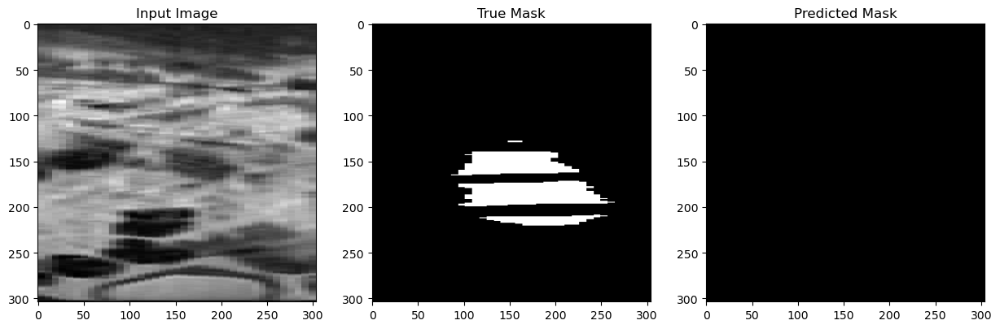

1/1 [==============================] - 3s 3s/step


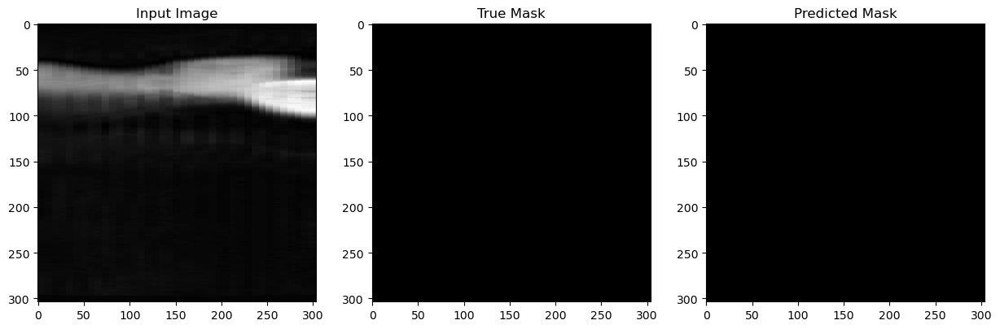

1/1 [==============================] - 3s 3s/step


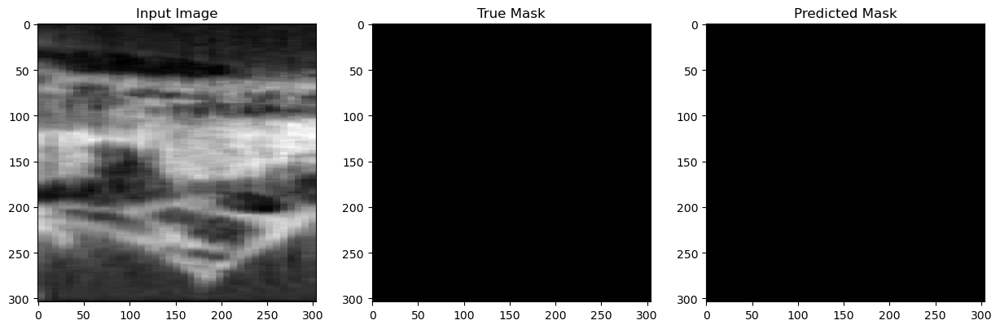

1/1 [==============================] - 3s 3s/step


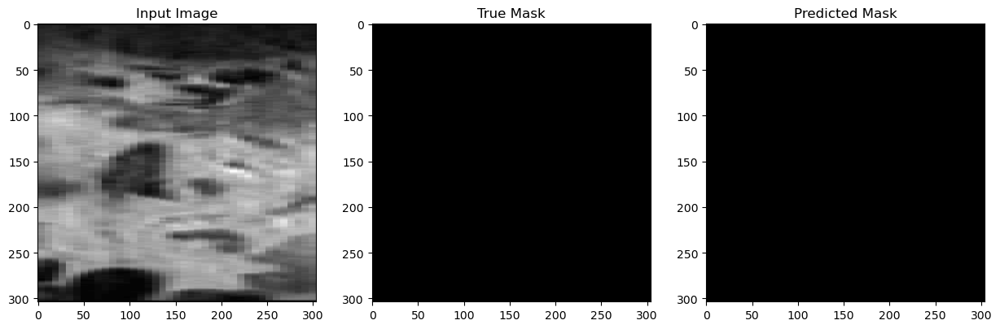

1/1 [==============================] - 3s 3s/step


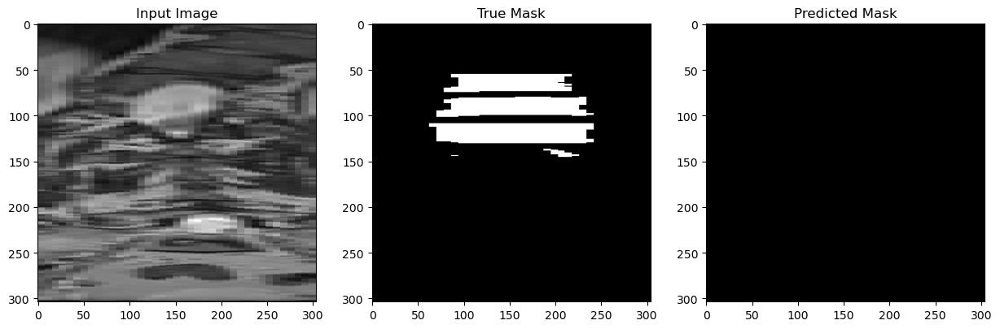

1/1 [==============================] - 3s 3s/step


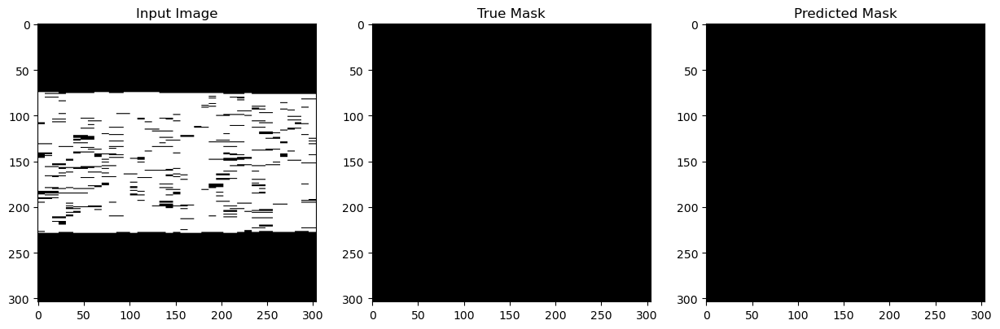

1/1 [==============================] - 3s 3s/step


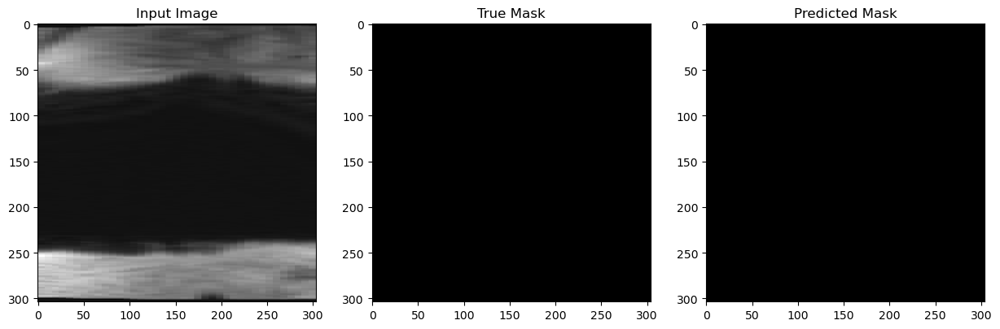

1/1 [==============================] - 3s 3s/step


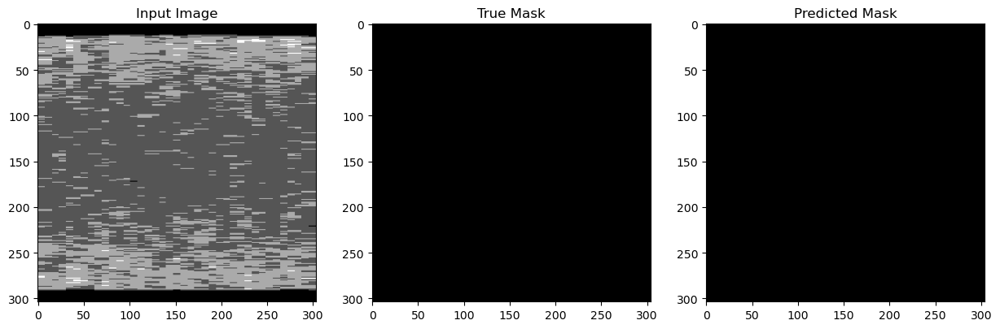

1/1 [==============================] - 3s 3s/step


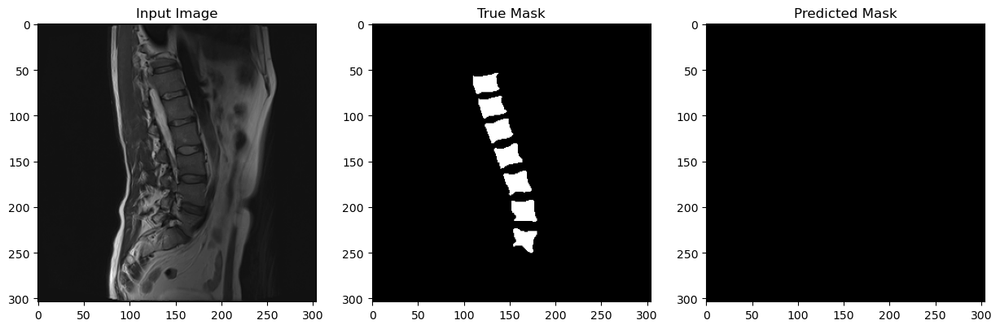

1/1 [==============================] - 3s 3s/step


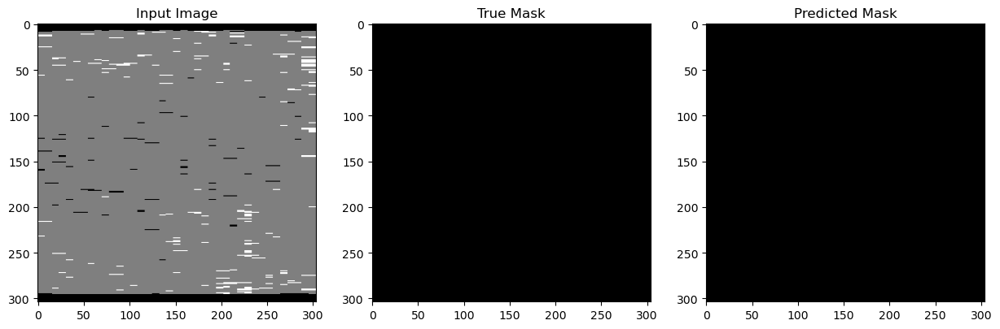

1/1 [==============================] - 3s 3s/step


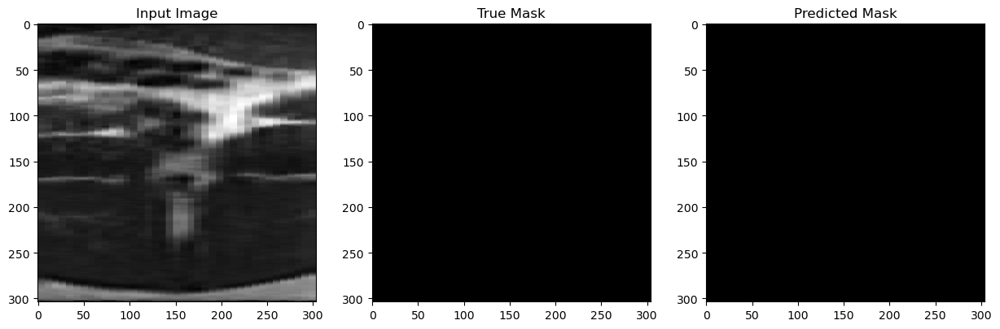

1/1 [==============================] - 3s 3s/step


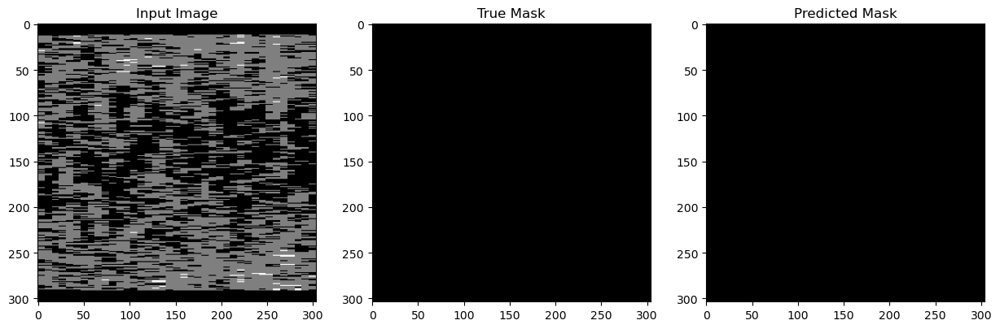

1/1 [==============================] - 3s 3s/step


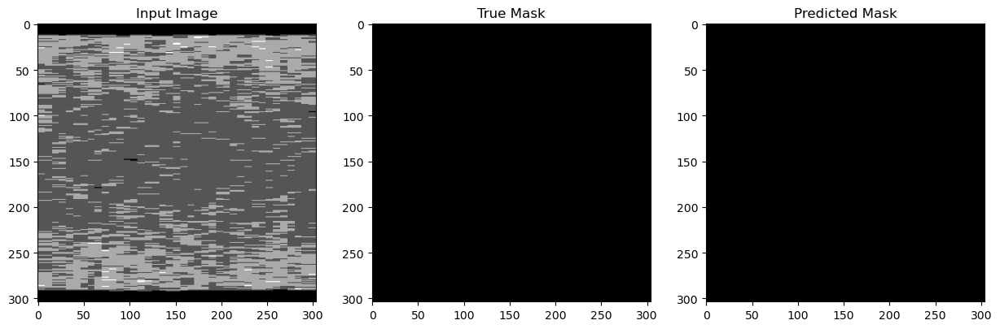

1/1 [==============================] - 3s 3s/step


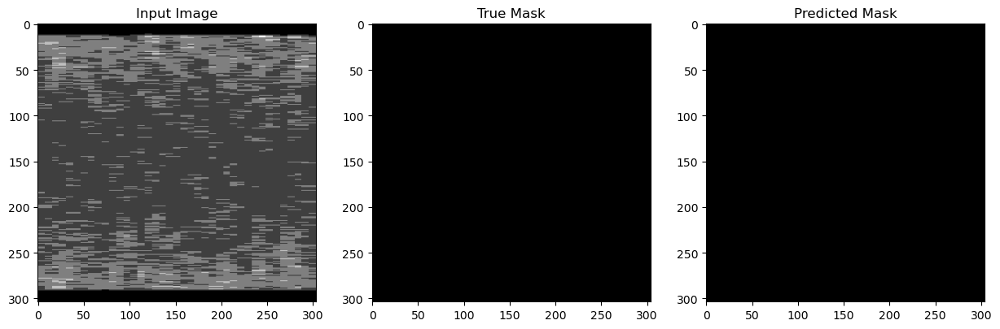

1/1 [==============================] - 3s 3s/step


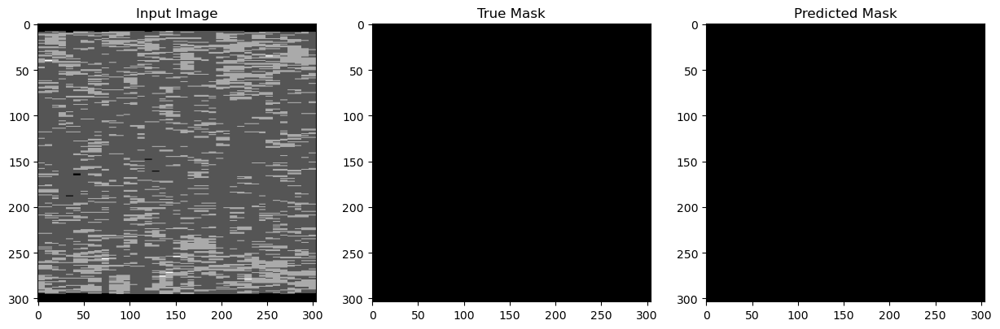

1/1 [==============================] - 3s 3s/step


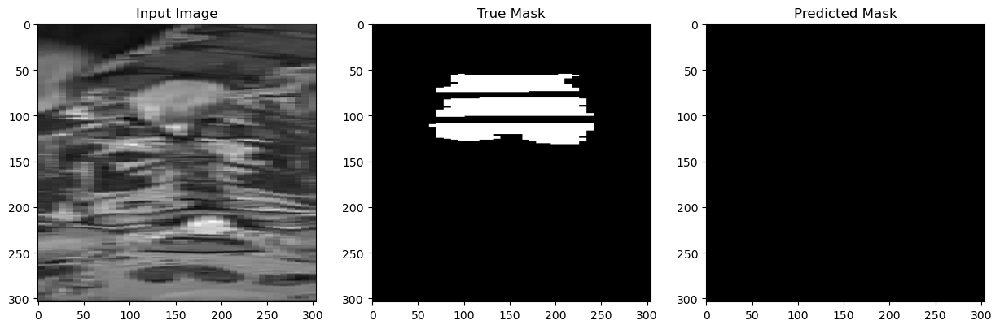

1/1 [==============================] - 3s 3s/step


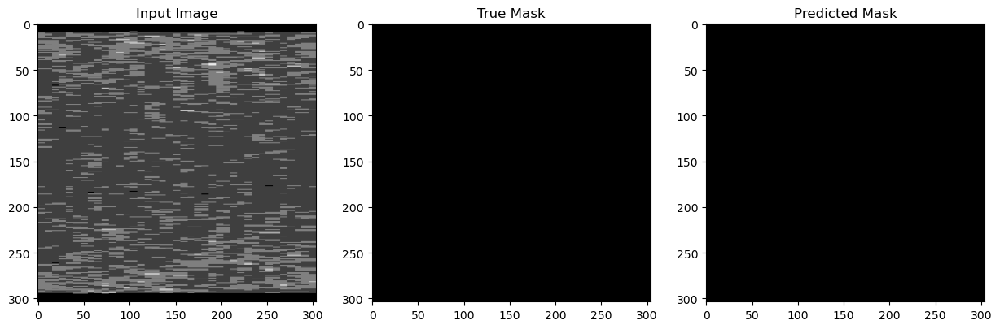

1/1 [==============================] - 3s 3s/step


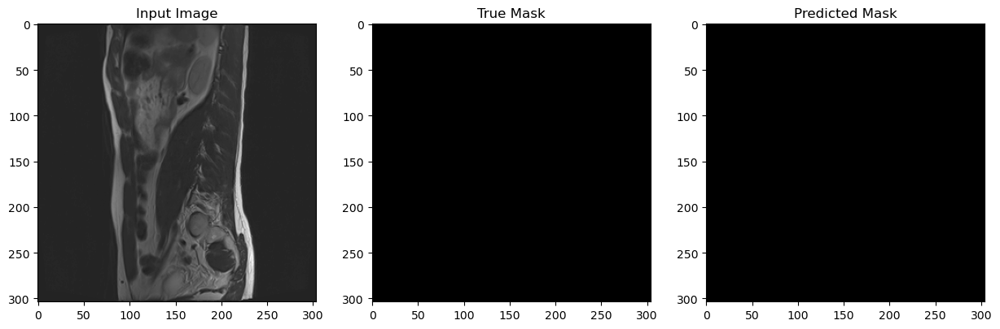

1/1 [==============================] - 3s 3s/step


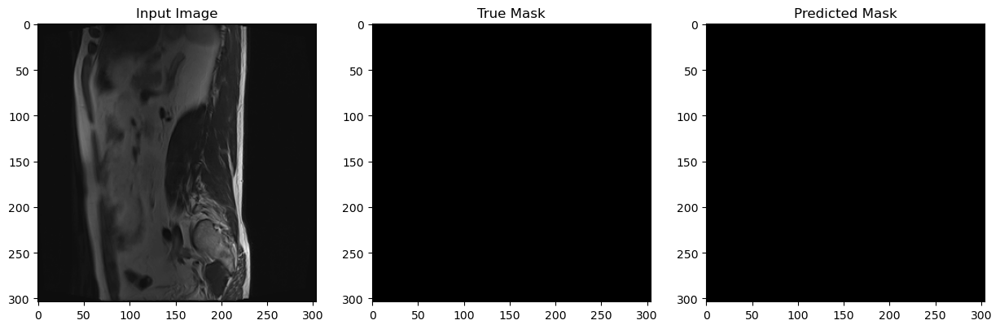

1/1 [==============================] - 3s 3s/step


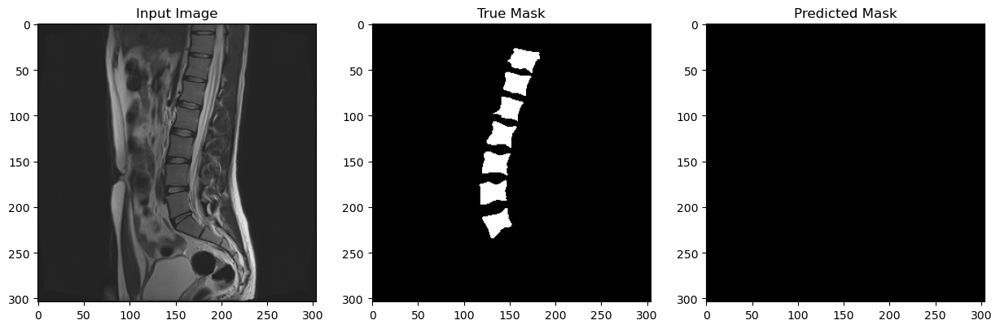

1/1 [==============================] - 3s 3s/step


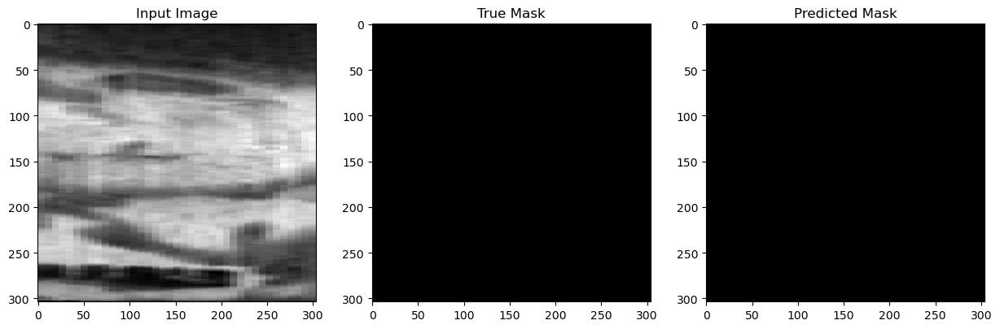

1/1 [==============================] - 3s 3s/step


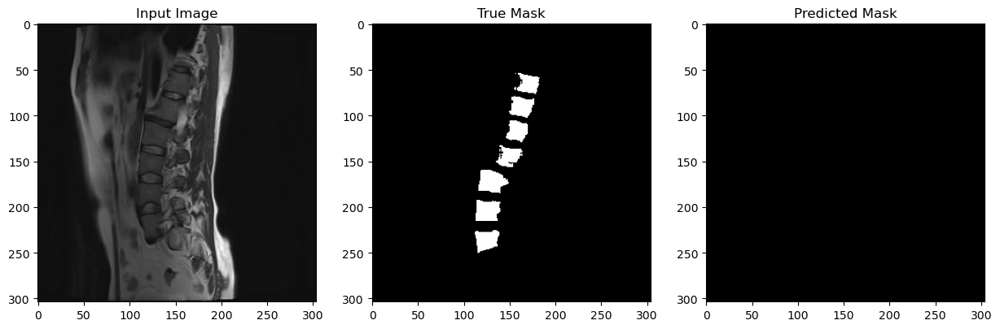

1/1 [==============================] - 3s 3s/step


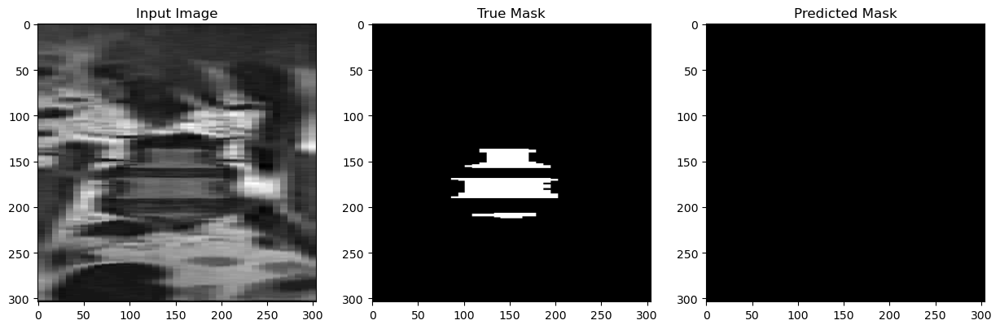

1/1 [==============================] - 3s 3s/step


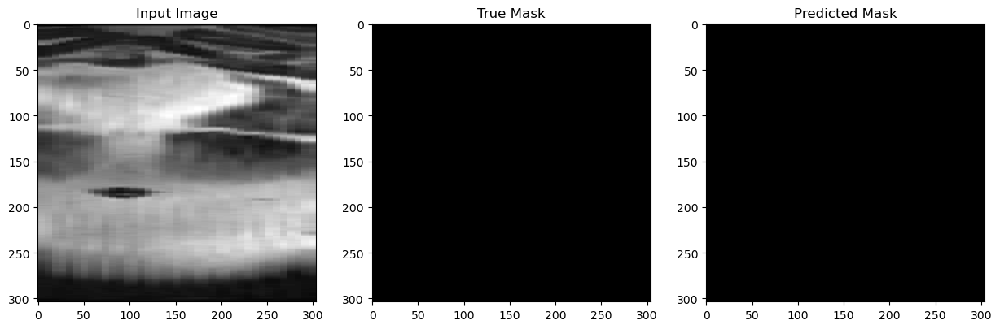

1/1 [==============================] - 3s 3s/step


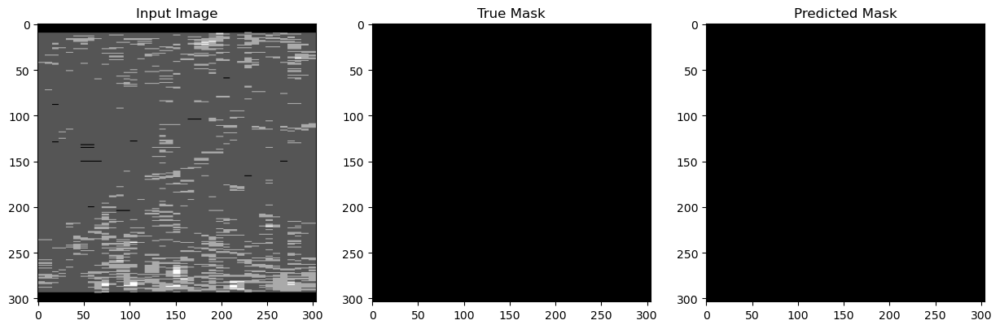

1/1 [==============================] - 3s 3s/step


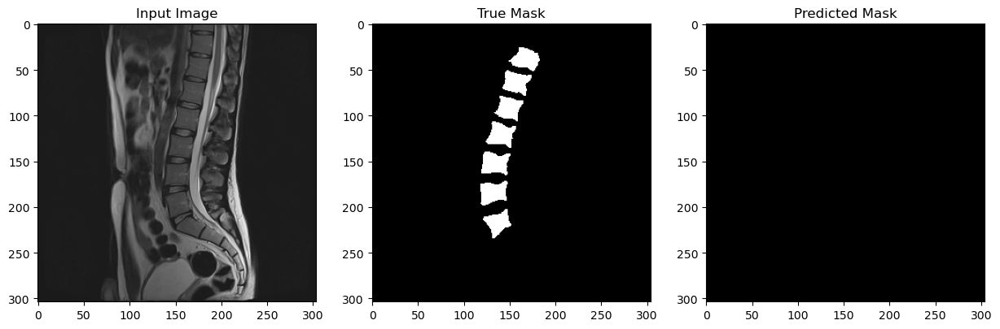

1/1 [==============================] - 3s 3s/step


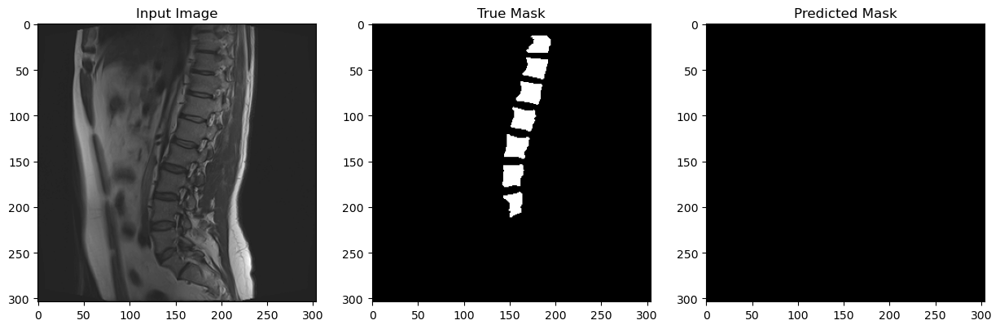

1/1 [==============================] - 3s 3s/step


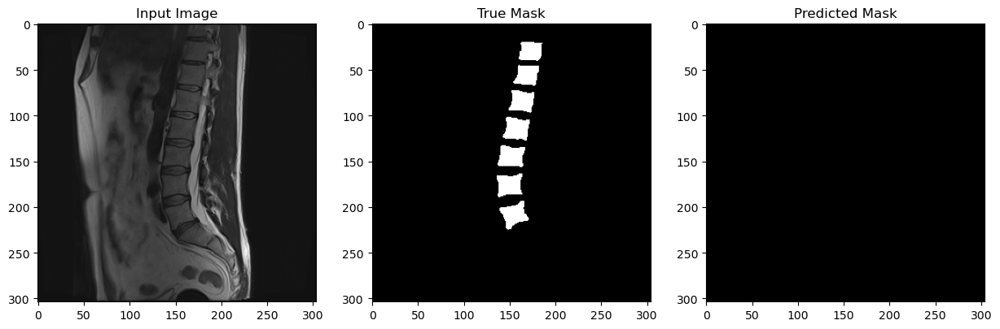

1/1 [==============================] - 3s 3s/step


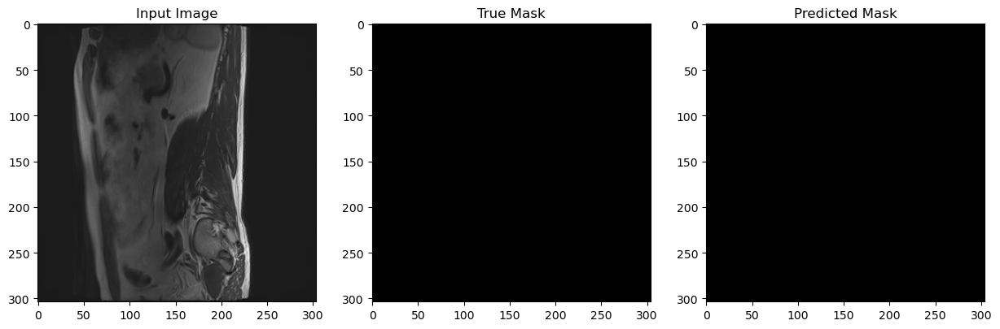

1/1 [==============================] - 3s 3s/step


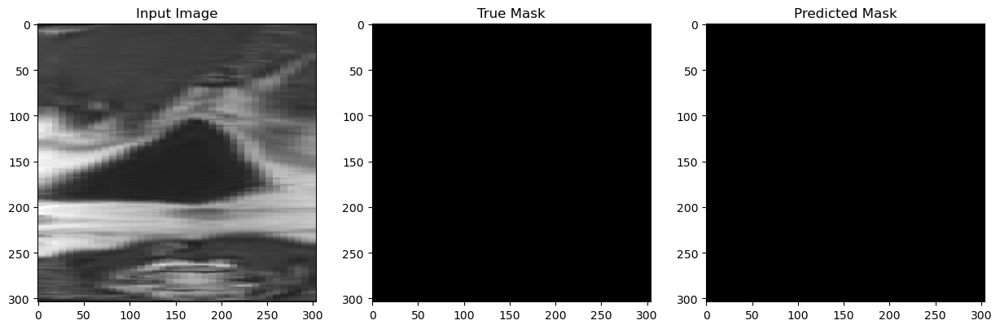

In [45]:

show_prediction(test_generator, 50)